# Data Analysis Code for BU Sustainability Project

## Part 1: Loading data

In [1]:
# Import Python functions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from google.colab import drive
import datetime
%matplotlib inline

In [2]:
# Mount drive from Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Loading University wide purchasing data as "df"
df = pd.read_excel('/content/drive/Shareddrives/Spark! and Sustainable Purchasing/Data/WB Mason Toner and Coffee Purchases_no pricing.xlsx')
df

,Requisition ID,Requisitioning Date,Supplier - ERP Supplier,Description,Requester - Shopper ID,Part - Supplier Part Number,Category
0,PR8853,2020-09-08,WB Mason Company,"952 Ink Cartridges - Cyan, Magenta, Yellow, 3 ...",AMBERFW,HEWN9K27AN,Toner
1,PR32062,2021-01-05,WB Mason Company,"61XL Ink Cartridge, Black (CH563WN)",TWARE,HEWCH563WN,Toner
2,PR12682,2020-09-24,WB Mason Company,"63 Ink Cartridges - Black, Tri-color, 2 Cartri...",SARAHBF,HEWL0R46AN,Toner
3,PR31013,2020-12-21,WB Mason Company,"62 Ink Cartridge, Black (C2P04AN)",JGGOMEZ,HEWC2P04AN,Toner
4,PR28465,2020-12-09,WB Mason Company,"962XL Ink Cartridge, Black (3JA03AN)",TAFELSKI,HEW3JA03AN,Toner
...,...,...,...,...,...,...,...
61425,PR42131,2021-02-17,WB Mason Company,"French Vanilla Liquid Coffee Creamer, 0.38 oz....",AJZALESK,NES35170BX,Coffee
61426,PR42169,2021-02-17,WB Mason Company,"Original Liquid Coffee Creamer, 0.38 oz. Singl...",LINHARES,NES35010,Coffee
61427,PR41858,2021-02-17,WB Mason Company,"Original Liquid Coffee Creamer, 0.38 oz. Singl...",YRODRIGU,NES35110BX,Coffee
61428,PR42131,2021-02-17,WB Mason Company,"Original Liquid Coffee Creamer, 0.38 oz. Singl...",AJZALESK,NES35110BX,Coffee


In [4]:
# Loading Department spending data as "df1"
df1 = pd.read_excel('/content/drive/Shareddrives/Spark! and Sustainable Purchasing/Data/Department Mason spend.xlsx')
df1 = df1.drop(columns=['Without\nPurchase Order', 'Unnamed: 19', 'Unnamed: 20']).dropna()
df1

,ARAVO Vendor ID,Vendor,Vendor Name,Type of Business,PO Creation Date,Product P/N (Vendor),Shopper,Unit,Unit name,With \nPurchase Order,Total Invoice \nAmount,Total Paid,Disc. Amount,Total Invoice \nQty,upper part,match,Category,Description
0,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-06,GMT6505,TIARAT,ZBU_ORG_U102,ADMINISTRATIVE SERVICES,19.68,19.68,19.68,0.39,2,GMT6505,1071,Coffee,"C-66920349|5853096957|Tea K-Cups Sampler, Asso..."
1,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-06,NES35110BX,TIARAT,ZBU_ORG_U102,ADMINISTRATIVE SERVICES,8.94,8.94,8.94,0.18,3,NES35110BX,1223,Coffee,"Original Liquid Coffee Creamer, 0.38 oz. Singl..."
2,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-11,GMT4050,MIKEJD,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,10.32,10.32,10.32,0.21,1,GMT4050,1017,Coffee,"Newman's Special Blend K-Cup Pods, 24/BX"
3,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-11,ITD102042,MLMORRIS,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,28.52,28.52,28.52,0.57,4,ITD102042,1260,Coffee,"Half AND Half Liquid Coffee Creamer, 0.3 oz. S..."
4,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-12,HEWC9731A,AMACKIN,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,195.57,195.57,195.57,0.00,1,HEWC9731A,590,Toner,"C-63961931|5840488845|645A, (C9731A) Cyan Orig..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61047,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6003,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,GMT6003,980,Coffee,"Colombian Coffee K-Cup Pods, 24/BX"
61048,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6520,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,GMT6520,1012,Coffee,"Breakfast Blend Coffee K-Cup Pods, 24/BX"
61049,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6570,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,GMT6570,1004,Coffee,"Our Blend Coffee K-Cup Pods, 24/BX"
61050,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6663,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,65.28,65.28,65.28,0.00,6,GMT6663,976,Coffee,"Nantucket Blend Coffee K-Cup Pods, 24/BX, 4 BX/CT"


In [5]:
# Loading paper purchasing data as "df2"
excel_reader=pd.ExcelFile('/content/drive/Shareddrives/Spark! and Sustainable Purchasing/Data/WBMason Paper and Toner.xlsx')
sheet_names = excel_reader.sheet_names
df2 = excel_reader.parse(sheet_name=sheet_names[1])
df2

,Requisition ID,Requisitioning Date,Supplier - ERP Supplier,Description,Requester - Shopper ID,Part - Supplier Part Number,sum(Requisition Spend),LDescription,Category,Year group,trimmed date shoppper part,matchnumber,Unit,Unit name,funds center,fc name
0,SH449754,2018-11-26,WB Mason Company,C-59301110|5821035628|Astrobrights Color Paper...,ANDREAMR,WAU21289,15.29,c-59301110|5821035628|astrobrights color paper...,Paper,2018,43430WAU21289ANDREAMR,29045,ZBU_ORG_U244,SCHOOL OF PUBLIC HEALTH (SPH),2442440000,SPH COMMUNITY HEALTH SCIENCES
1,SH449839,2018-11-26,WB Mason Company,"C-59311433|5821081290|78A, (CE278A) Black Orig...",JMORAN,HEWCE278A,43.75,"c-59311433|5821081290|78a, (ce278a) black orig...",Toner/Ink,2018,43430HEWCE278AJMORAN,28847,ZBU_ORG_U189,EVENTS & CONFERENCES,1890010000,Internal Event Administration
2,SH455528,2018-12-17,WB Mason Company,C-59869171|5823461205|Continuous Paper Label T...,CANNUN,BRTDK2205,39.12,c-59869171|5823461205|continuous paper label t...,Paper,2018,43451BRTDK2205CANNUN,33589,ZBU_ORG_U145,UNIVERSITY LIBRARIES,1450400000,"LIB CATALOG,PROFESSIONAL"
3,SH452999,2018-12-06,WB Mason Company,"C-59620403|5822419340|12A, (Q2612A) Black Orig...",JMALZONE,HEWQ2612A,127.89,"c-59620403|5822419340|12a, (q2612a) black orig...",Toner/Ink,2018,43440HEWQ2612AJMALZONE,31633,ZBU_ORG_U120,COLLEGE OF ARTS AND SCIS (CAS),1202060000,CAS ECONOMICS
4,SH453242,2018-12-06,WB Mason Company,C-59637773|5822492854|70C1HM0 (LEX-701HM) High...,JANEMAH,LEX70C1HM0,136.29,c-59637773|5822492854|70c1hm0 (lex-701hm) high...,Toner/Ink,2018,43440LEX70C1HM0JANEMAH,31656,ZBU_ORG_U257,SCHOOL OF MEDICINE (BUSM),2572020000,BS--BIOCHEMISTRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7846,PR13081,2020-09-28,WB Mason Company,"30% Recycled Copy Paper, 92 Bright, 20 lb., 8 ...",SARAHBF,WBM20030,171.00,"30% recycled copy paper, 92 bright, 20 lb., 8 ...",Paper,2020,44102WBM20030SARAHBF,no match to bus,no match to bus,no match to bus,no match to bus,no match to bus
7847,PR7995,2020-09-03,WB Mason Company,"78 Extra Bright AND Heavy Copy Paper, 98 Brigh...",CHRISQL,BLZ78200,61.60,"78 extra bright and heavy copy paper, 98 brigh...",Paper,2020,44077BLZ78200CHRISQL,no match to bus,no match to bus,no match to bus,no match to bus,no match to bus
7848,PR8853,2020-09-08,WB Mason Company,"952 Ink Cartridge, Black (F6U15AN)",AMBERFW,HEWF6U15AN,28.04,"952 ink cartridge, black (f6u15an)",Toner/Ink,2020,44082HEWF6U15ANAMBERFW,no match to bus,no match to bus,no match to bus,no match to bus,no match to bus
7849,PR1294,2020-08-05,WB Mason Company,"C-74454871|5881962155|Premium Copy Paper, 92 B...",KPRICCI,WBM21200,25.80,"c-74454871|5881962155|premium copy paper, 92 b...",Paper,2020,44048WBM21200KPRICCI,no match to bus,no match to bus,no match to bus,no match to bus,no match to bus


## Part 2: Data Processing

### Snapshot of the first 10 items in coffee and toner

In [6]:
coffee_req, toner_req = df[df.Category=='Coffee'], df[df.Category=='Toner']
coffee_req[:10], toner_req[:10]

(      Requisition ID Requisitioning Date  ... Part - Supplier Part Number Category
 16228       SH218419          2016-01-06  ...                     GMT6505   Coffee
 16229       SH218687          2016-01-06  ...                     GMT6505   Coffee
 16230       SH218692          2016-01-06  ...                     GMT6505   Coffee
 16231       SH218425          2016-01-06  ...                     GMT6505   Coffee
 16232       SH219652          2016-01-11  ...                     GMT4050   Coffee
 16233       SH219657          2016-01-11  ...                   ITD102042   Coffee
 16234       SH219699          2016-01-11  ...                   ITD102042   Coffee
 16235       SH219791          2016-01-12  ...                    TWG08762   Coffee
 16236       SH220241          2016-01-13  ...                     GMT6792   Coffee
 16237       SH220177          2016-01-13  ...                     GMT4061   Coffee
 
 [10 rows x 7 columns],
   Requisition ID Requisitioning Date  ... Part - 

### List of all unique items in coffee categorize

In [7]:
coffee_req_cat = coffee_req['Description'].str.split(',', expand=True)
coffee_req_cat[0].unique(), coffee_req_cat[1].unique(), coffee_req_cat[2].unique()

(array(['Tea K-Cups Sampler', 'C-19323837|5725967831|Tea K-Cups Sampler',
        'C-19324327|5725970348|Tea K-Cups Sampler', ...,
        'Coffee machine service to re-program and change water filter. The fee to service the unit and change out the filter is $79.99',
        'Laminate Computer Table Desk with Drawer',
        'Caffe Espresso Ground Coffee'], dtype=object),
 array([' Assorted Flavors', ' 24/Box', ' .375oz', ' 24/BX', ' 22/Box',
        ' Pike Place', ' Breakfast Blend', ' Paper', ' 8/10-Cup Size',
        ' Regular Ground', ' 24/ Box', None, ' Hazelnut', ' Country Roast',
        ' House Blend', ' Singles', ' Original', ' French Roast',
        ' Arabica', ' Cafe Verona', ' Fits 26 Pods',
        ' Classic Roast Ground', ' 25/BX', ' 25 Pods/Box',
        ' 5 2/5 x 11 x 12 3/5', ' Dark Roast', ' Sweetened Original',
        ' Fractional Packs', ' Black Silk', ' 12 Cup', ' 12-Cups',
        ' Signature-Level 3', ' French Vanilla', ' Cinnamon Vanilla',
        ' Pike Place

### List of all unique items in toner categorize

In [8]:
toner_req_cat = toner_req['Description'].str.split(',', expand=True)
toner_req_cat[0].unique(), toner_req_cat[1].unique(), toner_req_cat[2].unique()

(array(['952 Ink Cartridges - Cyan', '61XL Ink Cartridge',
        '63 Ink Cartridges - Black', ..., 'C-29404873|5772035762|130A',
        'C-22196188|5738506362|X264H11G High-Yield Toner',
        'C-19635261|5727182732|HP 78A'], dtype=object),
 array([' Magenta', ' Black (CH563WN)', ' Tri-color', ' Black (C2P04AN)',
        ' Black (3JA03AN)', ' Black (CN045AN)', ' Tri-color (CC644WN)',
        ' Black (C2P05AN)', ' Black', ' Black (F6U19AN)', ' Paper',
        ' Black (T6M14AN)', ' Black (3YM56AN)', ' Black (N9K04AN)',
        ' Black (F6U64AN)', ' Tri-color (N9J89AN)', ' Black (N9J90AN)',
        ' 2 Cartridges (3YN96AN)', ' Black (F6U62AN)',
        ' Tri-color (F6U63AN)', ' Tri-color (N9K03AN)', ' Black (CH561WN)',
        ' Black (F6U15AN)', ' 2 Cartridges (3JB40AN)',
        ' Tri-color (CH562WN)',
        ' (C9370A) Photo Black Original Ink Cartridge', ' Black (3YL65AN)',
        None, ' Magenta (CN055AN)', ' Black (CN049AN)', ' Cyan (CN054AN)',
        ' (C9449A) Photo Black 

### List of all unique item in paper categorize

In [9]:
paper_df = df2[df2['Description'].str.contains('Ream')]
paper_df['Description'].unique()

array(['C-56417606|5808667711|FIREWORX Colored Paper, 20lb, 8-1/2 x 11, Bottle Rocket Blue, 500 Sheets/Ream',
       'C-59489757|5821852877|FIREWORX Colored Paper, 20lb, 8-1/2 x 11, Crackling Canary, 500 Sheets/Ream',
       'C-56050265|5806950473|BriteHue Multipurpose Colored Paper, 24lb, 8-1/2 x 11, Green, 500 Sheets/Ream, 10 Reams/Carton',
       'C-59410909|5821512163|FIREWORX Colored Paper, 20lb, 8-1/2 x 11, Bottle Rocket Blue, 500 Sheets/Ream',
       'C-56050265|5806951262|Recycled Colored Paper, 20lb, 11 x 17, Blue, 500 Sheets/Ream, 5 Reams/Carton',
       'C-58927034|5819472813|FIREWORX Colored Paper, 24lb, 8-1/2 x 11, Bottle Rocket Blue, 500 Sheets/Ream',
       'C-58231079|5816514390|FIREWORX Colored Paper, 20lb, 8-1/2 x 14, Flashing Ivory, 500 Sheets/Ream',
       'C-58261715|5816646430|FIREWORX Colored Paper, 20lb, 8-1/2 x 11, Golden Glimmer, 500 Sheets/Ream',
       'C-59961900|5823845086|FIREWORX Colored Paper, 20lb, 8-1/2 x 11, Popper-mint Green, 500 Sheets/Ream',
     

### Data cleaning for first excel data

In [10]:
coffee = coffee_req[~coffee_req['Part - Supplier Part Number'].str.contains("Unclassified")]
toner = toner_req[~toner_req['Part - Supplier Part Number'].str.contains("Unclassified")]
coffee.describe()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  This is separate from the ipykernel package so we can avoid doing imports until


,Requisition ID,Requisitioning Date,Supplier - ERP Supplier,Description,Requester - Shopper ID,Part - Supplier Part Number,Category
count,45193,45193,45193,45193,45193,45193,45193
unique,16285,1129,1,44166,798,573,1
top,SH312986,2017-03-13 00:00:00,WB Mason Company,"Original Liquid Coffee Creamer, 0.38 oz. Singl...",LSKINNER,GMT6520,Coffee
freq,44,131,45193,77,983,2534,45193
first,NaN,2016-01-06 00:00:00,NaN,NaN,NaN,NaN,NaN
last,NaN,2021-02-17 00:00:00,NaN,NaN,NaN,NaN,NaN


In [11]:
toner.describe()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  """Entry point for launching an IPython kernel.


,Requisition ID,Requisitioning Date,Supplier - ERP Supplier,Description,Requester - Shopper ID,Part - Supplier Part Number,Category
count,16221,16221,16221,16221,16221,16221,16221
unique,8916,1088,1,15961,977,971,1
top,SH247682,2017-03-06 00:00:00,WB Mason Company,"62XL Ink Cartridge, Black (C2P05AN)",TWARE,HEWCE505A,Toner
freq,16,50,16221,8,281,347,16221
first,NaN,2016-01-12 00:00:00,NaN,NaN,NaN,NaN,NaN
last,NaN,2021-02-17 00:00:00,NaN,NaN,NaN,NaN,NaN


### List of all department University wide

In [12]:
df1['Unit name'].unique()

array(['ADMINISTRATIVE SERVICES', 'INFORMATION SERVICES & TECHNOLOGY',
       'SCHOOL OF MEDICINE (BUSM)', 'THE BU ACADEMY',
       'GENERAL ED SUPPORT & ACADEMIC INITIATIVS',
       'BUMC FACILITIES MANAGEMENT',
       'HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)',
       'PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC', 'PROVOST',
       'QUESTROM SCHOOL OF BUSINESS (QST)',
       'COLLEGE OF ARTS AND SCIS (CAS)', 'CENTRAL ADMINISTRATION',
       'GLOBAL PROGRAMS', 'MET & EXTENDED EDUCATION ADMINISTRATION',
       'VICE PRESIDENT FINANCE', 'COLLEGE OF ENGINEERING (ENG)',
       'DEVELOPMENT & ALUMNI RELATIONS', 'METROPOLITAN COLLEGE (MET)',
       'NATL EMERGING INFECTIOUS DIS LAB (NEIDL)',
       'ENROLLMENT & STUDENT AFFAIRS', 'SDM DENTAL CLINICS',
       'SARGENT COLLEGE OF HEALTH & REHAB. SCI.',
       'SCHOOL OF PUBLIC HEALTH (SPH)', 'UNIV PROFESSORS-HONORS COLLEGE',
       'CRC FACILITIES MANAGEMENT & PLANNING',
       'COLLEGE OF FINE ARTS (CFA)', 'GRADUATE MEDICAL SCIENCES (GMS)',
   

### Total request number for both coffee and toner during 2016-2021, categorized by department

In [13]:
df1['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   6616
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    5721
COLLEGE OF ARTS AND SCIS (CAS)              5421
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    3611
SCHOOL OF PUBLIC HEALTH (SPH)               2538
ADMINISTRATIVE SERVICES                     2200
INFORMATION SERVICES & TECHNOLOGY           1973
METROPOLITAN COLLEGE (MET)                  1757
ENROLLMENT & STUDENT AFFAIRS                1590
SCHOOL OF LAW (LAW)                         1572
COLLEGE OF ENGINEERING (ENG)                1533
CRC FACILITIES MANAGEMENT & PLANNING        1521
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     1511
VICE PRESIDENT FINANCE                      1506
ACADEMIC INSTITUTES & CENTERS               1450
QUESTROM SCHOOL OF BUSINESS (QST)           1349
PROVOST                                     1299
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    1262
GRADUATE MEDICAL SCIENCES (GMS)             1101
COLLEGE OF FINE ARTS (CFA)                  1095
MEDICAL CAMPUS ADMIN

### Total request number for coffee during 2016-2021, categorized by department

In [14]:
coffee_req1, toner_req1 = df1[df1.Category=='Coffee'], df1[df1.Category=='Toner']
s_date = datetime.datetime.strptime('20160101', '%Y%m%d')
e_date = datetime.datetime.strptime('20161231', '%Y%m%d')
y2016_req = df1[(df1['PO Creation Date']>=s_date) & (df1['PO Creation Date'] <= e_date) & (df1.Category=='Coffee')]

s_date2 = datetime.datetime.strptime('20170101', '%Y%m%d')
e_date2 = datetime.datetime.strptime('20171231', '%Y%m%d')
y2017_req = df1[(df1['PO Creation Date']>=s_date2) & (df1['PO Creation Date'] <= e_date2) & (df1.Category=='Coffee')]

s_date3 = datetime.datetime.strptime('20180101', '%Y%m%d')
e_date3 = datetime.datetime.strptime('20181231', '%Y%m%d')
y2018_req = df1[(df1['PO Creation Date']>=s_date3) & (df1['PO Creation Date'] <= e_date3)& (df1.Category=='Coffee')]

s_date4 = datetime.datetime.strptime('20190101', '%Y%m%d')
e_date4 = datetime.datetime.strptime('20191231', '%Y%m%d')
y2019_req = df1[(df1['PO Creation Date']>=s_date4) & (df1['PO Creation Date'] <= e_date4)& (df1.Category=='Coffee')]

s_date5 = datetime.datetime.strptime('20200101', '%Y%m%d')
e_date5 = datetime.datetime.strptime('20201231', '%Y%m%d')
y2020_req = df1[(df1['PO Creation Date']>=s_date5) & (df1['PO Creation Date'] <= e_date5)& (df1.Category=='Coffee')]

test1 = pd.Series(coffee_req1['Unit name'].value_counts(), name="total")
test2 = pd.Series(y2016_req['Unit name'].value_counts(), name="2016")
test3 = pd.Series(y2017_req['Unit name'].value_counts(), name="2017")
test4 = pd.Series(y2018_req['Unit name'].value_counts(), name="2018")
test5 = pd.Series(y2019_req['Unit name'].value_counts(), name="2019")
test6 = pd.Series(y2020_req['Unit name'].value_counts(), name="2020")
df3 = pd.concat([test1, test2, test3, test4, test5], axis=1).fillna(0)
df3

,total,2016,2017,2018,2019
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM),4062,962.0,992.0,965.0,895.0
SCHOOL OF MEDICINE (BUSM),3722,825.0,939.0,897.0,843.0
COLLEGE OF ARTS AND SCIS (CAS),3366,727.0,835.0,895.0,752.0
GENERAL ED SUPPORT & ACADEMIC INITIATIVS,2696,591.0,636.0,579.0,674.0
ADMINISTRATIVE SERVICES,2014,471.0,470.0,503.0,478.0
INFORMATION SERVICES & TECHNOLOGY,1812,355.0,515.0,600.0,280.0
SCHOOL OF PUBLIC HEALTH (SPH),1769,469.0,452.0,375.0,391.0
ENROLLMENT & STUDENT AFFAIRS,1558,293.0,319.0,421.0,442.0
METROPOLITAN COLLEGE (MET),1512,346.0,371.0,372.0,354.0
VICE PRESIDENT FINANCE,1385,349.0,324.0,274.0,359.0


### Total request number for toner during 2016-2021, categorized by department

In [15]:
s_date = datetime.datetime.strptime('20160101', '%Y%m%d')
e_date = datetime.datetime.strptime('20161231', '%Y%m%d')
y2016_req = df1[(df1['PO Creation Date']>=s_date) & (df1['PO Creation Date'] <= e_date) & (df1.Category=='Toner')]

s_date2 = datetime.datetime.strptime('20170101', '%Y%m%d')
e_date2 = datetime.datetime.strptime('20171231', '%Y%m%d')
y2017_req = df1[(df1['PO Creation Date']>=s_date2) & (df1['PO Creation Date'] <= e_date2) & (df1.Category=='Toner')]

s_date3 = datetime.datetime.strptime('20180101', '%Y%m%d')
e_date3 = datetime.datetime.strptime('20181231', '%Y%m%d')
y2018_req = df1[(df1['PO Creation Date']>=s_date3) & (df1['PO Creation Date'] <= e_date3)& (df1.Category=='Toner')]

s_date4 = datetime.datetime.strptime('20190101', '%Y%m%d')
e_date4 = datetime.datetime.strptime('20191231', '%Y%m%d')
y2019_req = df1[(df1['PO Creation Date']>=s_date4) & (df1['PO Creation Date'] <= e_date4)& (df1.Category=='Toner')]

s_date5 = datetime.datetime.strptime('20200101', '%Y%m%d')
e_date5 = datetime.datetime.strptime('20201231', '%Y%m%d')
y2020_req = df1[(df1['PO Creation Date']>=s_date5) & (df1['PO Creation Date'] <= e_date5)& (df1.Category=='Toner')]

test1 = pd.Series(toner_req1['Unit name'].value_counts(), name="total")
test2 = pd.Series(y2016_req['Unit name'].value_counts(), name="2016")
test3 = pd.Series(y2017_req['Unit name'].value_counts(), name="2017")
test4 = pd.Series(y2018_req['Unit name'].value_counts(), name="2018")
test5 = pd.Series(y2019_req['Unit name'].value_counts(), name="2019")
test6 = pd.Series(y2020_req['Unit name'].value_counts(), name="2020")
df4 = pd.concat([test1, test2, test3, test4, test5], axis=1).fillna(0)
df4

,total,2016,2017,2018,2019
SCHOOL OF MEDICINE (BUSM),2894,666.0,755.0,683.0,627.0
COLLEGE OF ARTS AND SCIS (CAS),2055,522.0,549.0,442.0,433.0
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM),1659,386.0,414.0,466.0,303.0
GENERAL ED SUPPORT & ACADEMIC INITIATIVS,915,255.0,233.0,179.0,205.0
SCHOOL OF PUBLIC HEALTH (SPH),769,199.0,211.0,169.0,164.0
COLLEGE OF ENGINEERING (ENG),577,163.0,129.0,156.0,116.0
COLLEGE OF FINE ARTS (CFA),430,107.0,124.0,100.0,80.0
SCHOOL OF LAW (LAW),418,99.0,86.0,105.0,101.0
SARGENT COLLEGE OF HEALTH & REHAB. SCI.,404,98.0,106.0,92.0,89.0
QUESTROM SCHOOL OF BUSINESS (QST),365,81.0,74.0,101.0,82.0


## Part 3: Visual Demonstration

### Order request counts for coffee request among the whole university, categorized by date

,req_times
date,
2016,9820
2017,11494
2018,11967
2019,10644
2020,895
2021,382


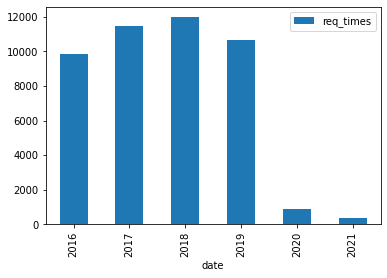

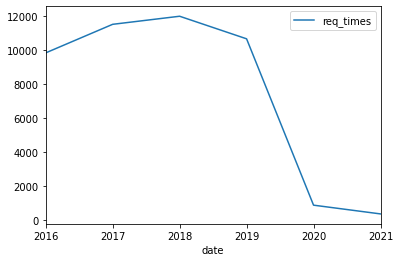

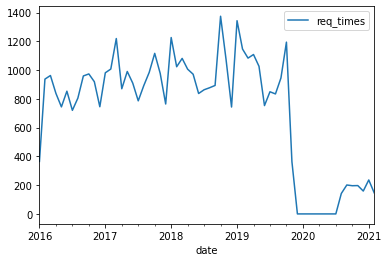

In [16]:
## Now processing the data from coffee_req
coffee_req_num_by_date = coffee_req.groupby(['Requisitioning Date','Category']).size().reset_index(name='req_times')[['Requisitioning Date','req_times']]
coffee_req_num_by_date.columns = ['date','req_times']
cqd = coffee_req_num_by_date.set_index('date')
cqm = cqd.resample('MS').sum().to_period('M')
cqy = cqd.resample('YS').sum().to_period('Y')
cqy.plot(kind='bar')
cqy.plot()
cqm.plot()
cqy

### Order request counts for toner request among the whole university, categorized by date

,req_times
date,
2016,4255
2017,4183
2018,4051
2019,3208
2020,387
2021,144


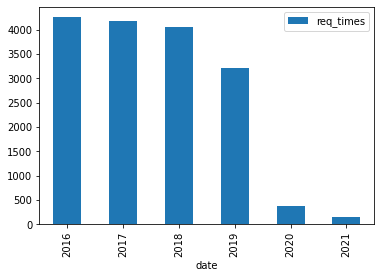

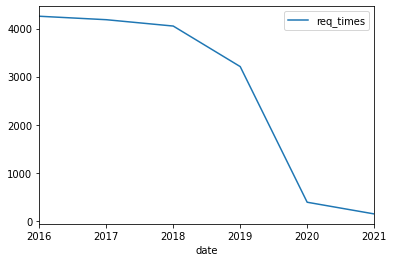

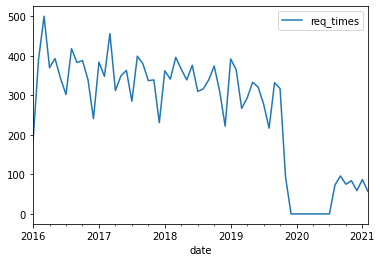

In [17]:
## Now processing the data from toner_req
toner_req_num_by_date = toner_req.groupby(['Requisitioning Date','Category']).size().reset_index(name='req_times')[['Requisitioning Date','req_times']]
toner_req_num_by_date.columns = ['date','req_times']
tqd = toner_req_num_by_date.set_index('date')
tqm = tqd.resample('MS').sum().to_period('M')
tqy = tqd.resample('YS').sum().to_period('Y')
tqy.plot(kind='bar')
tqy.plot()
tqm.plot()
tqy

### All requested coffee products and their rank by order requests count

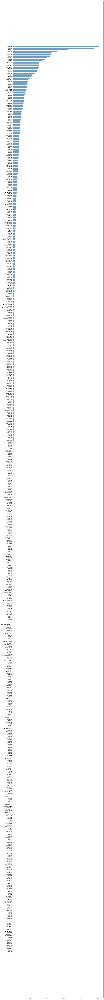

In [18]:
items, counts =np.unique(sorted(coffee['Part - Supplier Part Number']), return_counts=True)

temp = pd.DataFrame(data={'items': items,'counts': counts}).sort_values(by=['counts'])

items, counts = temp['items'],temp ['counts']

plt.figure(figsize=(16,180)) 
plt.barh(range(len(counts)), counts, height=0.7, color='steelblue', alpha=0.8)
plt.yticks(range(len(counts)), items)
plt.show()

### Top 20 requested coffee products and their proportions

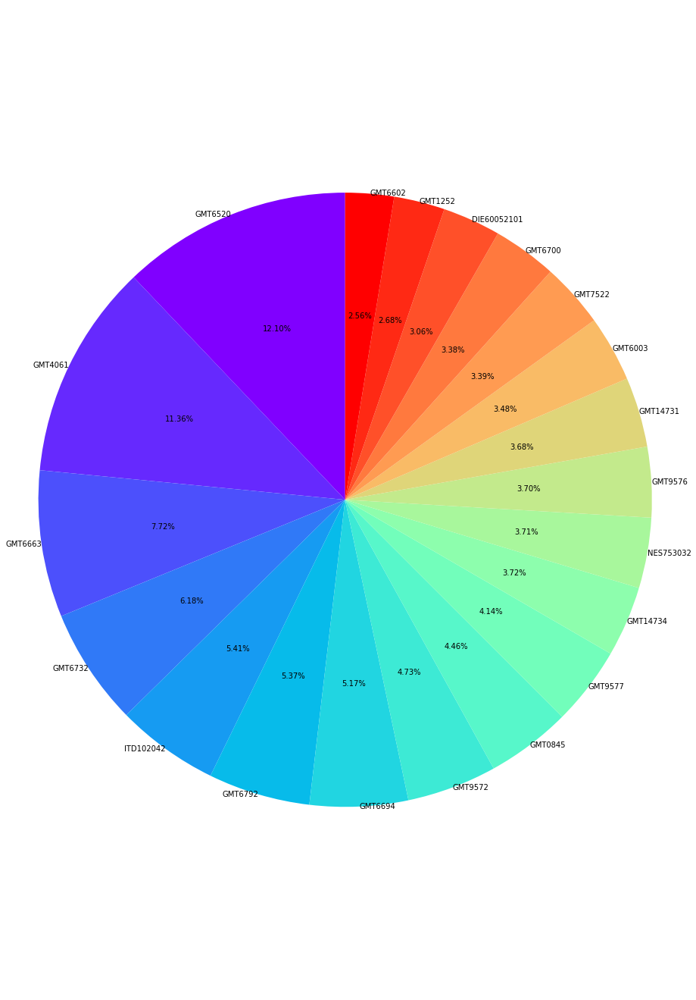

In [19]:
items, counts =np.unique(sorted(coffee['Part - Supplier Part Number']), return_counts=True)

temp = pd.DataFrame(data={'items': items,'counts': counts}).sort_values(by=['counts'])

items, counts = temp['items'][-20:][::-1],temp ['counts'][-20:][::-1]

plt.figure(figsize=(16,24))                        #resize the figure
labels = items                                     #define the labels as Supplier Part Number
sizes = counts                                     #define the size corresponds to its count
colors = cm.rainbow(np.linspace(0, 1, len(labels)))#define the color for each sector
explode = (0,)*len(sizes)                          #make distance between sectors

patches,text1,text2 = plt.pie(sizes,
                      explode=explode,
                      labels=labels,
                      colors=colors,
                      labeldistance = 1,           
                      autopct = '%3.2f%%',         
                      shadow = False,              #no shadow
                      startangle =90,              #counter-clockwise
                      pctdistance = 0.6)           #value distance from the center of the pie


plt.axis('equal')
plt.show()

### All requested toner products and their rank by order requests count

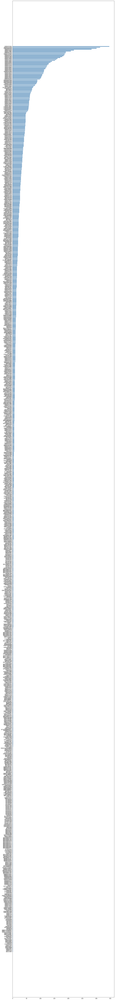

In [20]:
items, counts =np.unique(sorted(toner['Part - Supplier Part Number']), return_counts=True)

temp = pd.DataFrame(data={'items': items,'counts': counts}).sort_values(by=['counts'])

items, counts = temp['items'],temp ['counts']

plt.figure(figsize=(16,160)) 
plt.barh(range(len(counts)), counts, height=0.7, color='steelblue', alpha=0.8)
plt.yticks(range(len(counts)), items)
plt.show()

### Top 20 requested toner products and their proportions

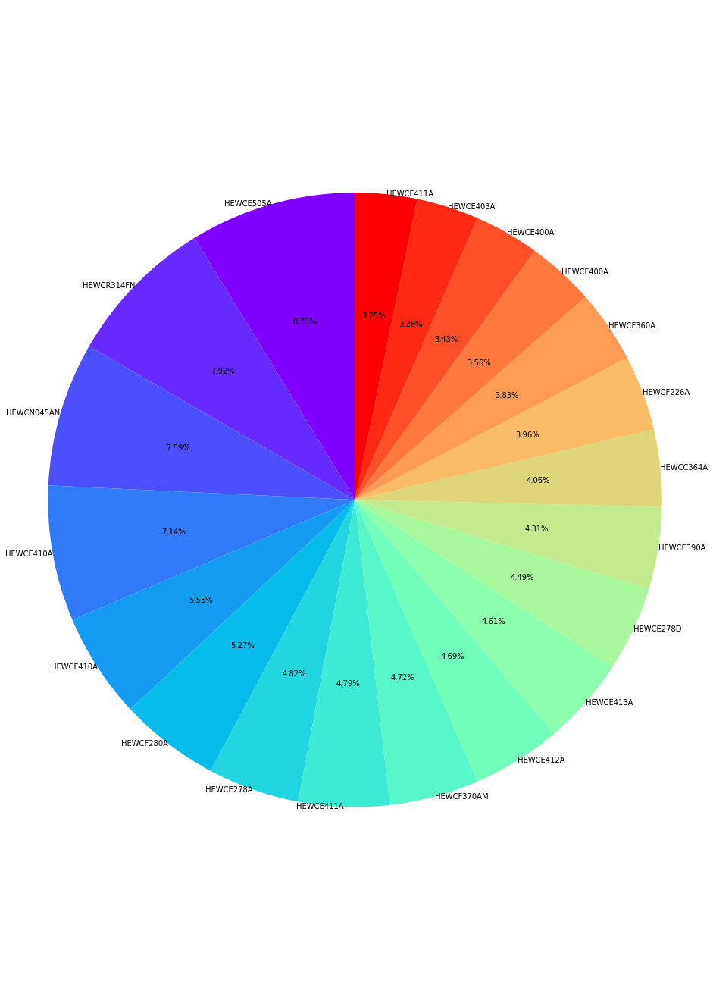

In [21]:
items, counts =np.unique(sorted(toner['Part - Supplier Part Number']), return_counts=True)

temp = pd.DataFrame(data={'items': items,'counts': counts}).sort_values(by=['counts'])

items, counts = temp['items'][-20:][::-1],temp ['counts'][-20:][::-1]

plt.figure(figsize=(16,24))                        #resize the figure
labels = items                                     #define the labels as Supplier Part Number
sizes = counts                                     #define the size corresponds to its count
colors = cm.rainbow(np.linspace(0, 1, len(labels)))#define the color for each sector
explode = (0,)*len(sizes)                          #make distance between sectors

patches,text1,text2 = plt.pie(sizes,
                      explode=explode,
                      labels=labels,
                      colors=colors,
                      labeldistance = 1,           
                      autopct = '%3.2f%%',         
                      shadow = False,              #no shadow
                      startangle =90,              #counter-clockwise
                      pctdistance = 0.6)           #value distance from the center of the pie


plt.axis('equal')
plt.show()

### Componets for a singel unit of plastic coffee pod

total: 3.0213 g

Shell total: 1.7908 g + 0.7841 g (ring) = 2.5749 g [Polypropylene]

Lid total: 0.2462 g = Aluminum (24%) PET coating (12%) LDPE (50%) Printing ink (14%)

Filter Total: 0.2002 g (6.63%) = Kraft paper, bleached (79%) + LDPE (21%)

reference: https://www.nature.com/articles/s41598-020-65058-1/tables/3


### Waste weight of the top 18 consumed k-cup pods university wide during year 2016-2021

In [22]:
items, counts =np.unique(sorted(coffee['Part - Supplier Part Number']), return_counts=True)

temp = pd.DataFrame(data={'items': items,'counts': counts}).sort_values(by=['counts'])

items, counts = temp['items'][-20:][::-1],temp ['counts'][-20:][::-1]

total_number = sum([ i * 24 for i in counts]) - counts.tolist()[4] - counts.tolist()[11] # ??????????????????
print("the total number of eighteen most used K-cup university wide during year 2016-2021 is " ,total_number, " pieces")

the total number of eighteen most used K-cup university wide during year 2016-2021 is  500508  pieces


In [23]:
(Polypropylene,Aluminum,PET,LDPE,Printing,paper) = (2.5749 * total_number,
                                                    0.0591 * total_number,
                                                    0.0295 * total_number,
                                                  ( 0.1231 + 0.042 )* total_number,
                                                    0.0345 * total_number,
                                                    0.1582 * total_number)
print("the total waste weight of the top 18 consumed k-cup pods university wide during year 2016-2021 includes:")
print("total weight: ", 3.0213 * total_number, " g")
print("total weight of Polypropylene: ", 2.5749 * total_number, " g")
print("total weight of Aluminum:", 0.0591 * total_number, "g")

print("total weight of PET coating: ", 0.0295 * total_number, " g")
print("total weight of LDPE: ",( 0.1231 + 0.042 )* total_number, " g")
print("total weight of Printing ink: ", 0.0345 * total_number, " g")
print("total weight of bleached Kraft paper: ", 0.1582 * total_number, " g")

the total waste weight of the top 18 consumed k-cup pods university wide during year 2016-2021 includes:
total weight:  1512184.8204  g
total weight of Polypropylene:  1288758.0492  g
total weight of Aluminum: 29580.0228 g
total weight of PET coating:  14764.985999999999  g
total weight of LDPE:  82633.8708  g
total weight of Printing ink:  17267.526  g
total weight of bleached Kraft paper:  79180.3656  g


In [24]:
def draw(lable, size):
  from matplotlib import font_manager as fm
  plt.figure(figsize=(12,18))                        #resize the figure
  labels = lable                                     #define the labels as Supplier Part Number
  sizes = size                                     #define the size corresponds to its count
  colors = cm.rainbow(np.linspace(0.3, 1, len(labels)))#define the color for each sector
  explode = (0,)*len(sizes)                          #make distance between sectors

  patches,text1,text2 = plt.pie(sizes,
                        explode=explode,
                        labels=labels,
                        colors=colors,
                        labeldistance = 1,           
                        autopct = '%3.2f%%',         
                        shadow = True,              #no shadow
                        startangle =0,              #counter-clockwise
                        pctdistance = 0.6)           #value distance from the center of the pie

  proptease = fm.FontProperties()
  proptease.set_size('x-large')
  # font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
  plt.setp(text1, fontproperties=proptease)
  plt.setp(text2, fontproperties=proptease)

  plt.axis('equal')
  plt.legend()
  plt.show()

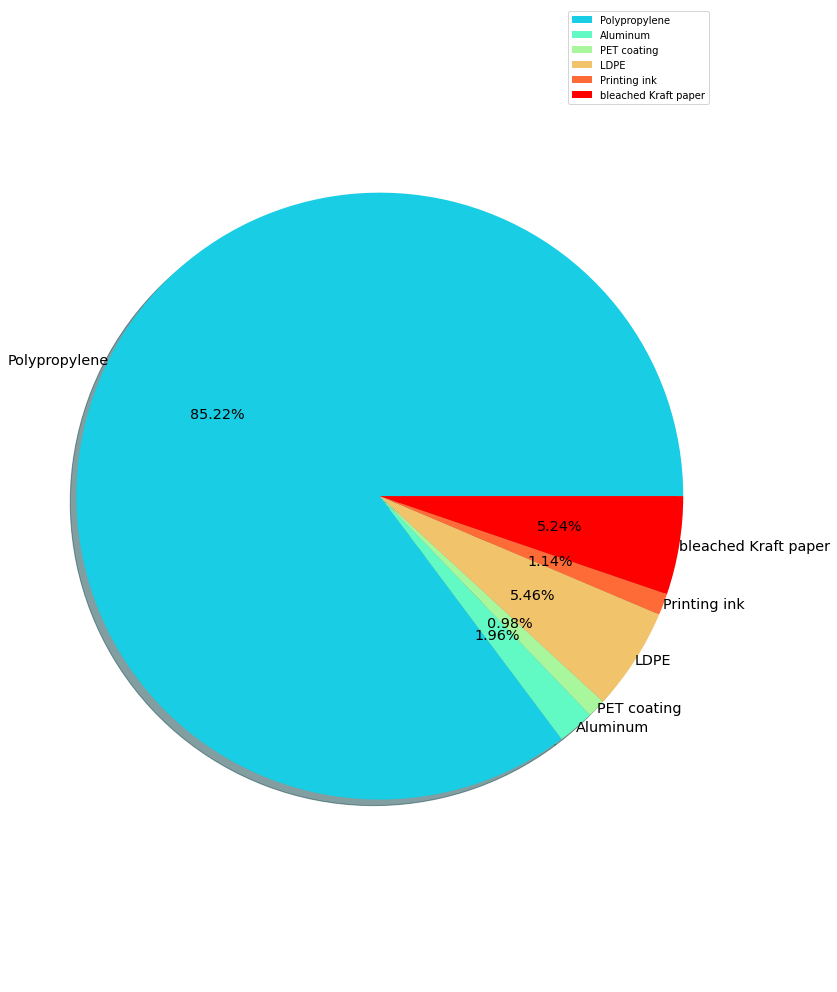

In [25]:
coffee_comp = ['Polypropylene','Aluminum','PET coating','LDPE','Printing ink','bleached Kraft paper']
coffee_comp_size = [Polypropylene,Aluminum,PET,LDPE,Printing,paper]
draw(coffee_comp,coffee_comp_size)

### Componets for a singel unit of plastic coffee pod

total:  2.3467 g

Shell total: 1.3909 g + 0.6090 g (ring) = 1.999 g [Polypropylene]

Lid total: 0.1912 g = Aluminum (24%) PET coating (12%) LDPE (50%) Printing ink (14%)

Filter Total: 0.1555 g (6.63%) = Kraft paper, bleached (79%) + LDPE (21%)

reference: https://www.nature.com/articles/s41598-020-65058-1/tables/3

### Waste weight of the top 18 consumed coffee creamer pods university wide during year 2016-2021

In [26]:
print("total waste for the top two creams: ITD102042 + NES753032")
total2 = (counts.tolist()[4] + counts.tolist()[11]) * 2.3467
print("total weight: ", total2 , " g")

print("total weight of Polypropylene: ", 2.5749 / 3.0213 * total2, " g")
print("total weight of Aluminum:", 0.0591 / 3.0213 * total2, "g")
print("total weight of Printing ink: ", 0.0345/ 3.0213 * total2, " g")
print("total weight of PET coating: ", 0.0295/3.0213 * total2, " g")
print("total weight of LDPE: ",0.1231 / 3.0213 * total2, " g")

(Polypropylene,Aluminum,PET,LDPE,Printing) = (2.5749 / 3.0213 * total2,
                                                    0.0591 / 3.0213 * total2,
                                                    0.0295/3.0213 * total2,
                                                    0.1231 / 3.0213 * total2,
                                                    0.0345/ 3.0213 * total2)

total waste for the top two creams: ITD102042 + NES753032
total weight:  4477.5036  g
total weight of Polypropylene:  3815.9481083109918  g
total weight of Aluminum: 87.58496764968721 g
total weight of Printing ink:  51.12828060768544  g
total weight of PET coating:  43.71838486744116  g
total weight of LDPE:  182.4316331248138  g


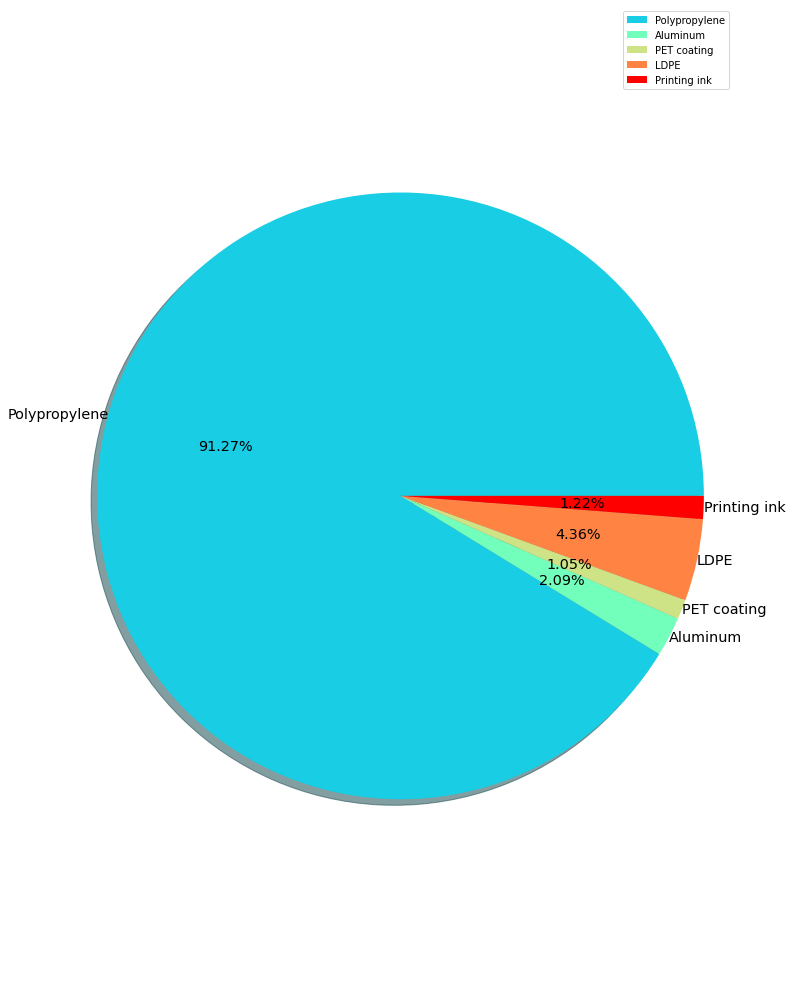

In [27]:
cream_comp = ['Polypropylene','Aluminum','PET coating','LDPE','Printing ink']
cream_comp_size = [Polypropylene,Aluminum,PET,LDPE,Printing]
draw(cream_comp,cream_comp_size)

### Total request number for coffee during 2016-2021, categorized by department and their proportions

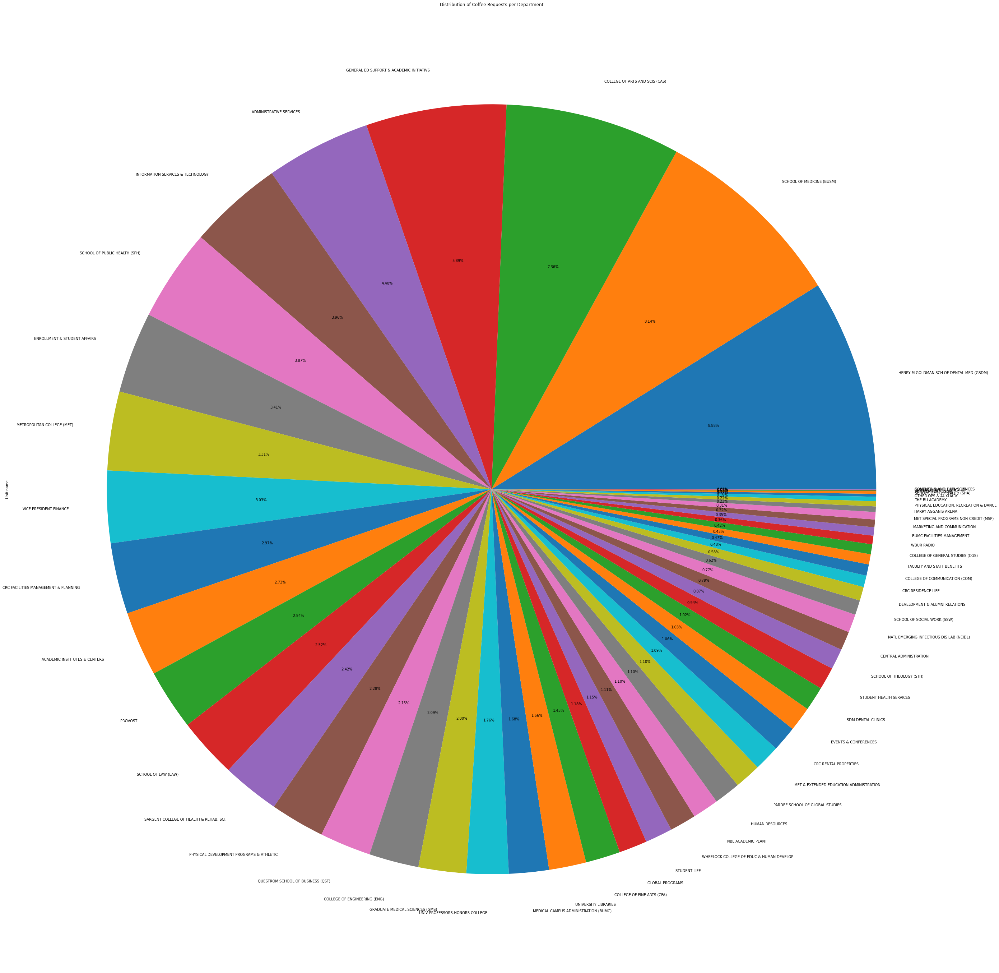

In [28]:
coffee_req1['Unit name'].value_counts().plot.pie(figsize=(48,72),title="Distribution of Coffee Requests per Department",autopct='%1.2f%%')
plt.gca().set_aspect('equal')

### Total request number for toner during 2016-2021, categorized by department and their proportions

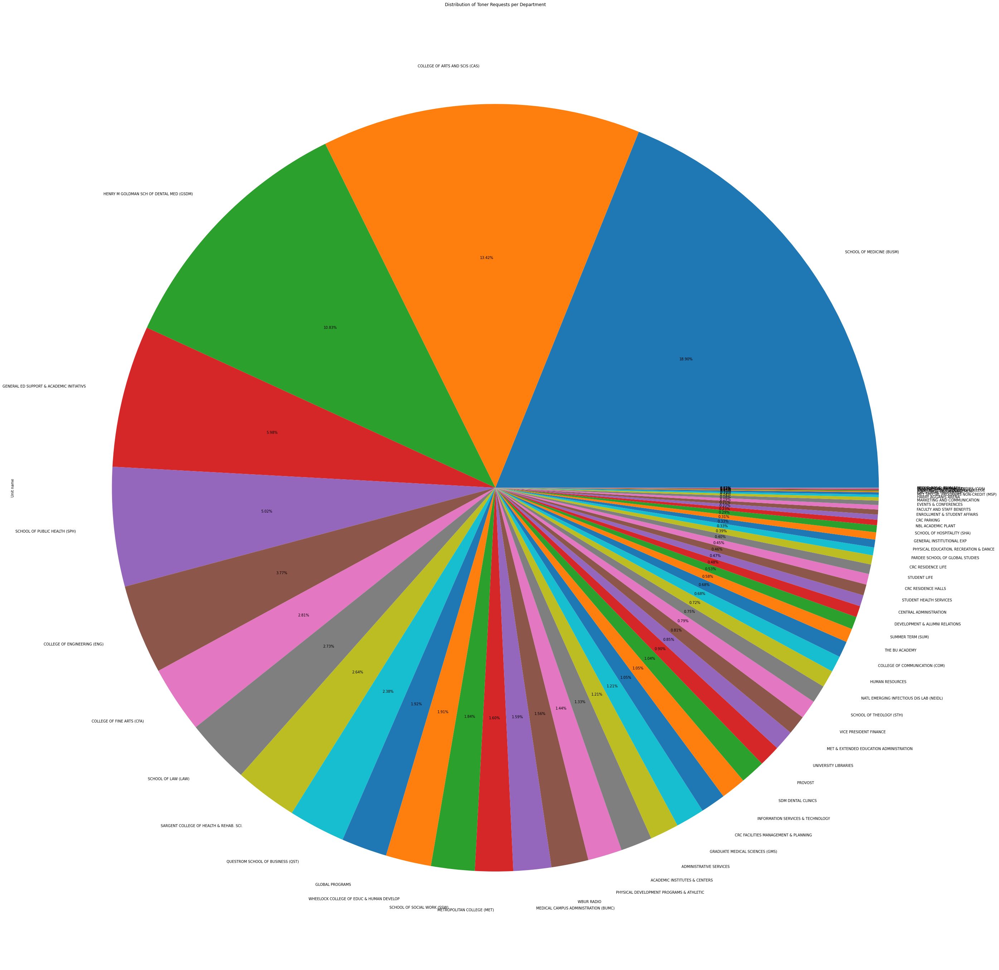

In [29]:
toner_req1['Unit name'].value_counts().plot.pie(figsize=(48,72),title="Distribution of Toner Requests per Department",autopct='%1.2f%%')
plt.gca().set_aspect('equal')

### Top 10 consumed coffee product and its order interval during 2016 - 2021, university wide

"GMT6520"
The mean is ：0.686462
The standard div is ：1.322605


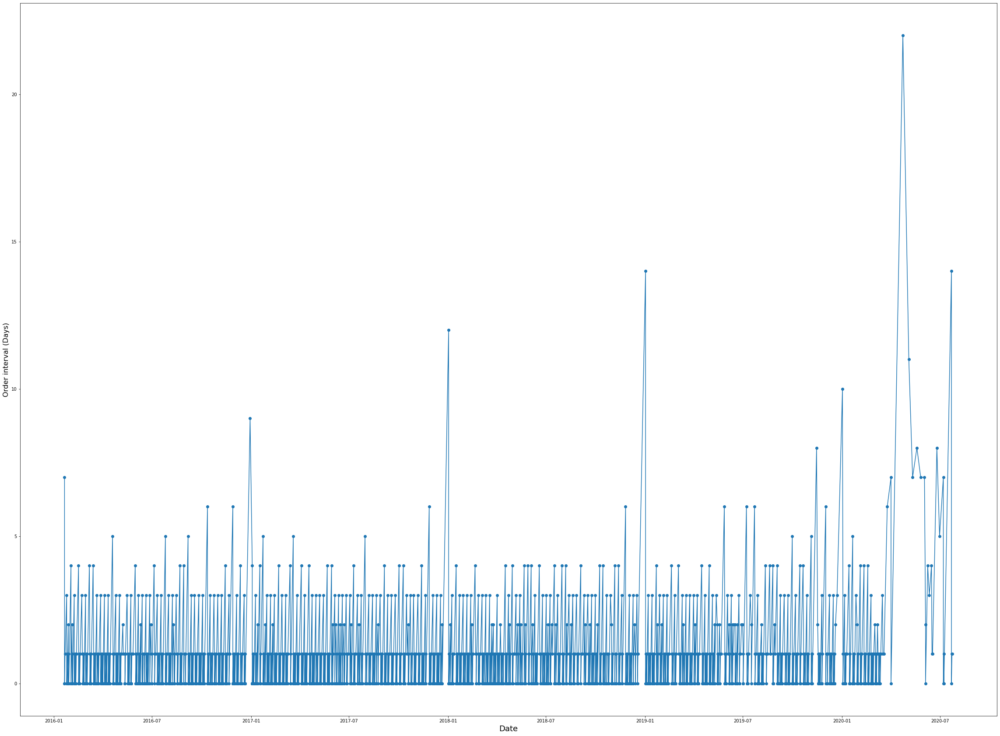

"GMT4061"
The mean is ：0.720665
The standard div is ：1.468255


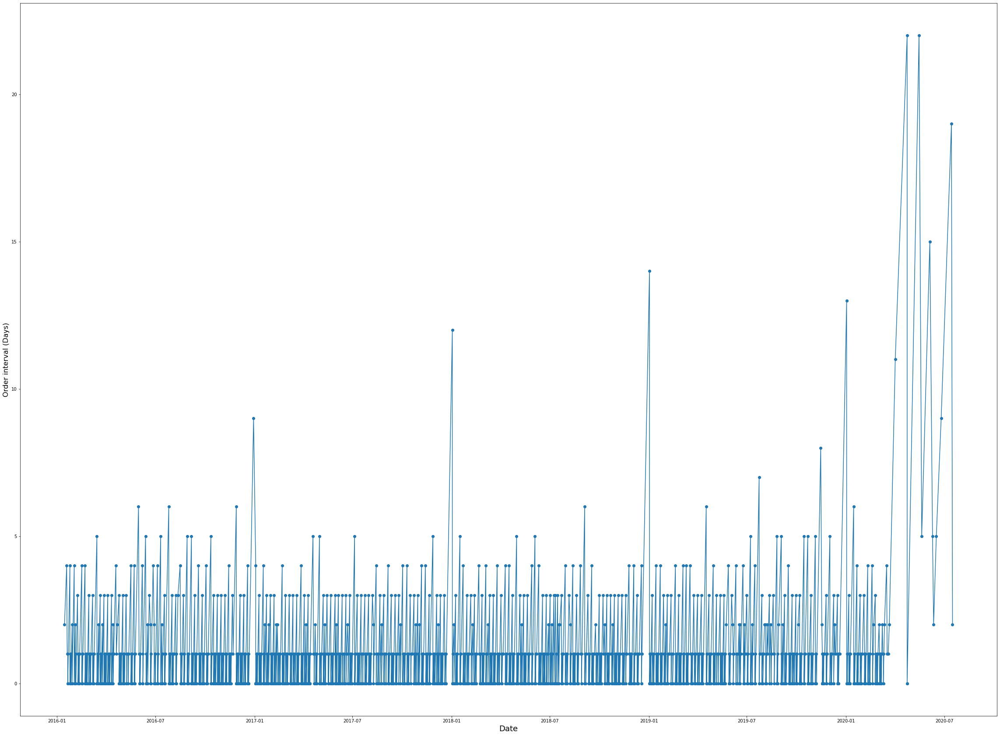

"GMT6663"
The mean is ：1.060606
The standard div is ：1.759254


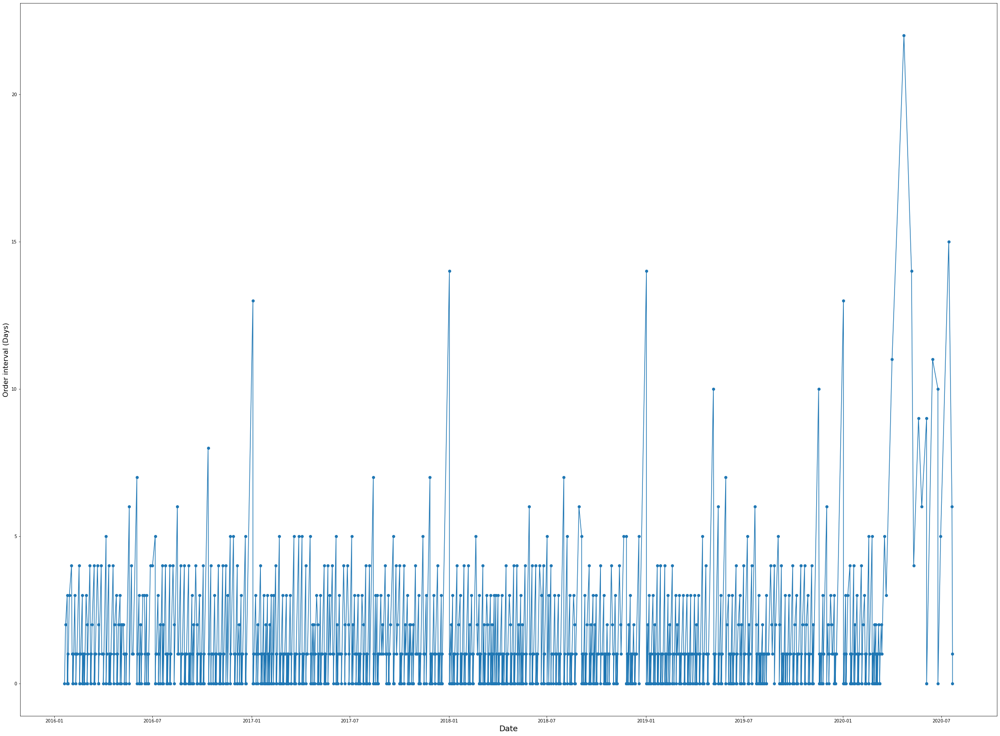

"NES35110BX"
The mean is ：1.261597
The standard div is ：2.052914


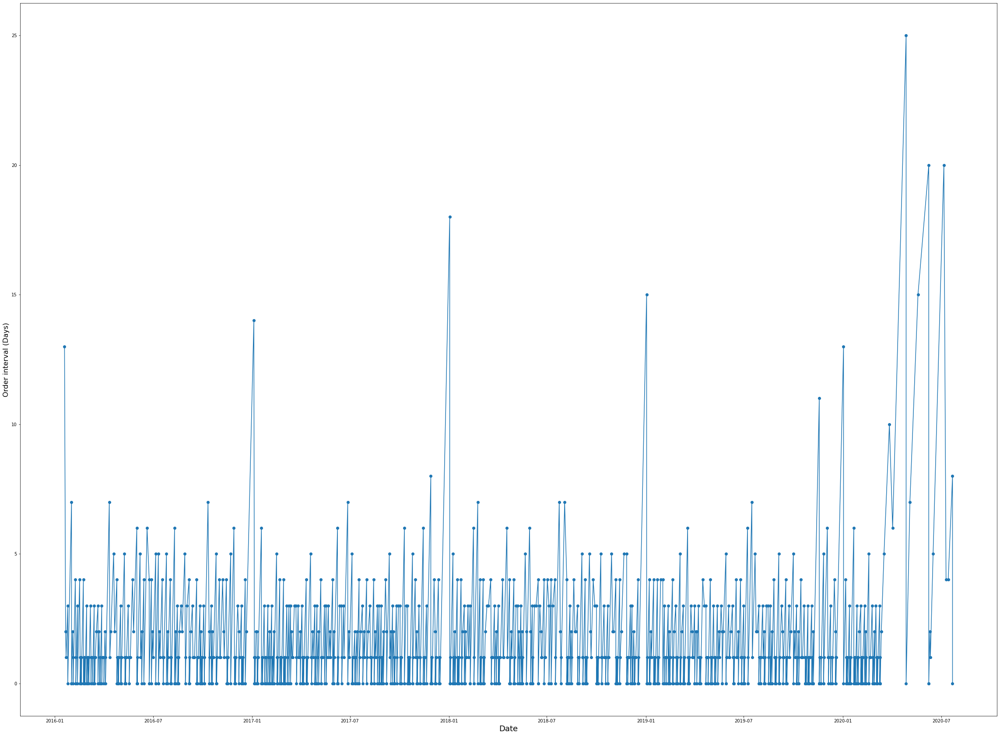

"GMT6732"
The mean is ：1.378649
The standard div is ：2.156530


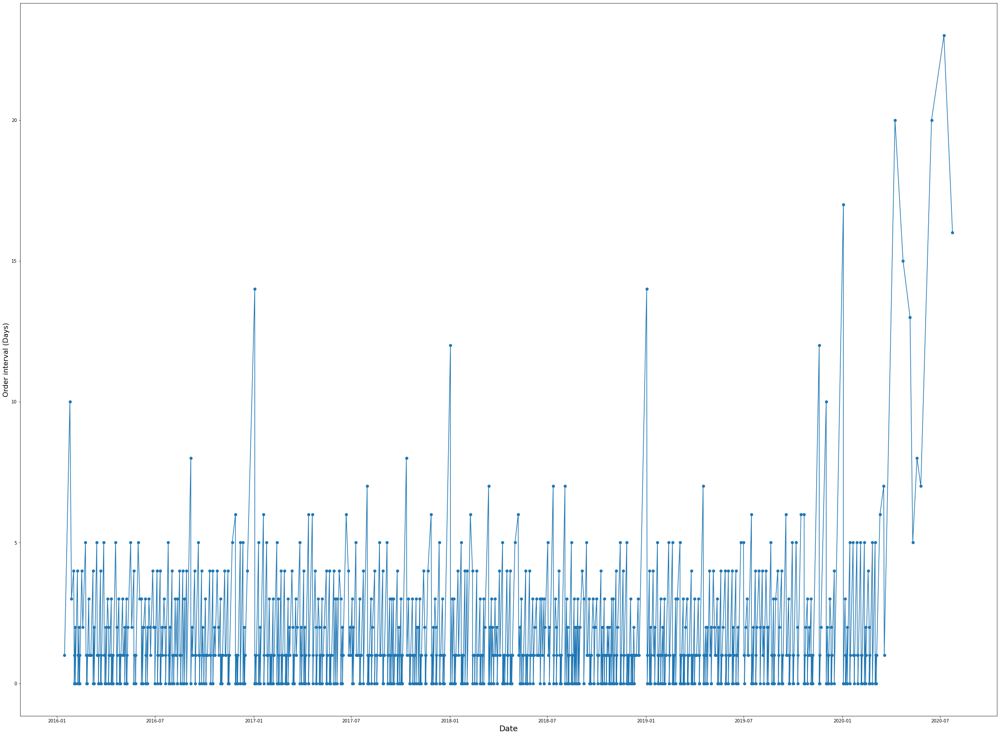

"ITD102042"
The mean is ：1.402053
The standard div is ：3.829675


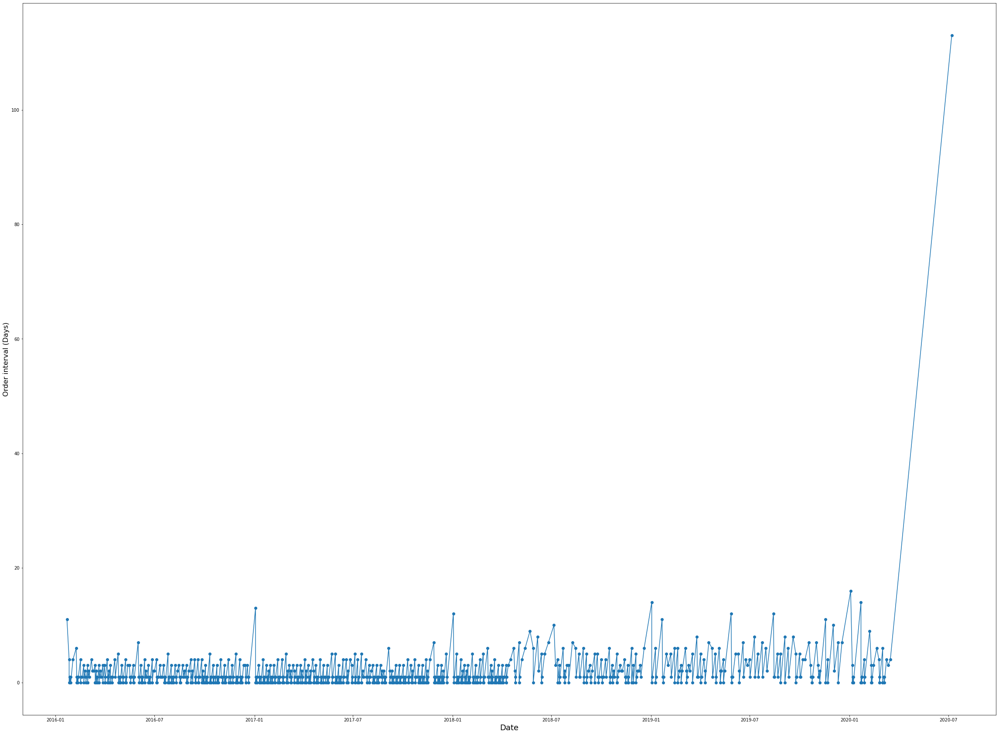

"GMT6792"
The mean is ：1.527002
The standard div is ：2.153711


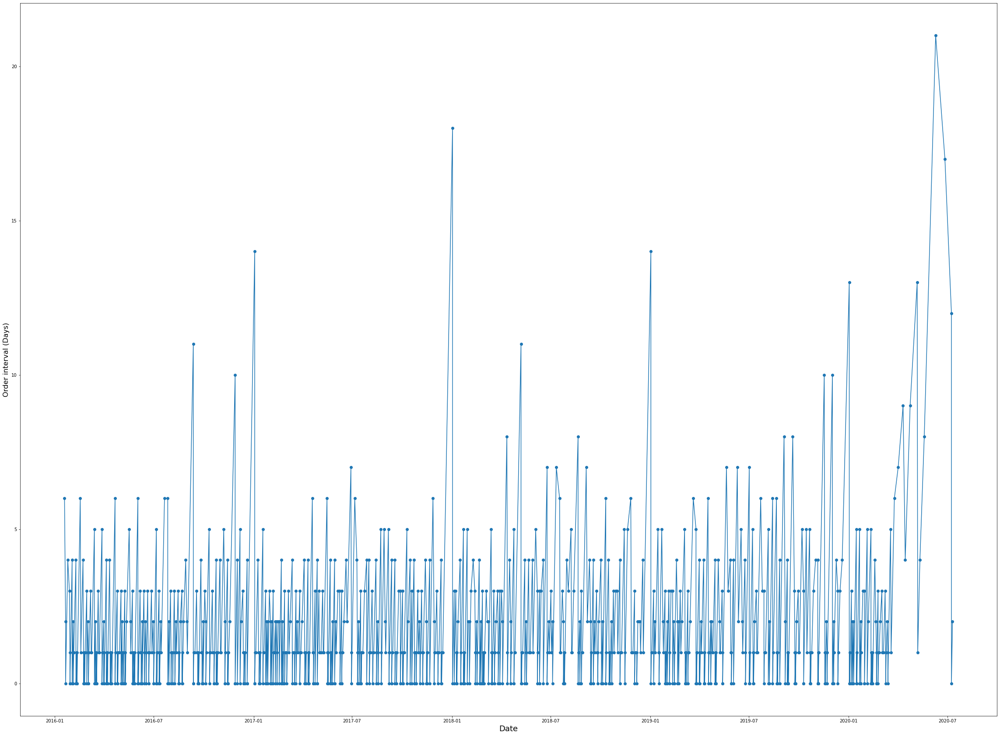

"GMT6694"
The mean is ：1.611765
The standard div is ：2.578238


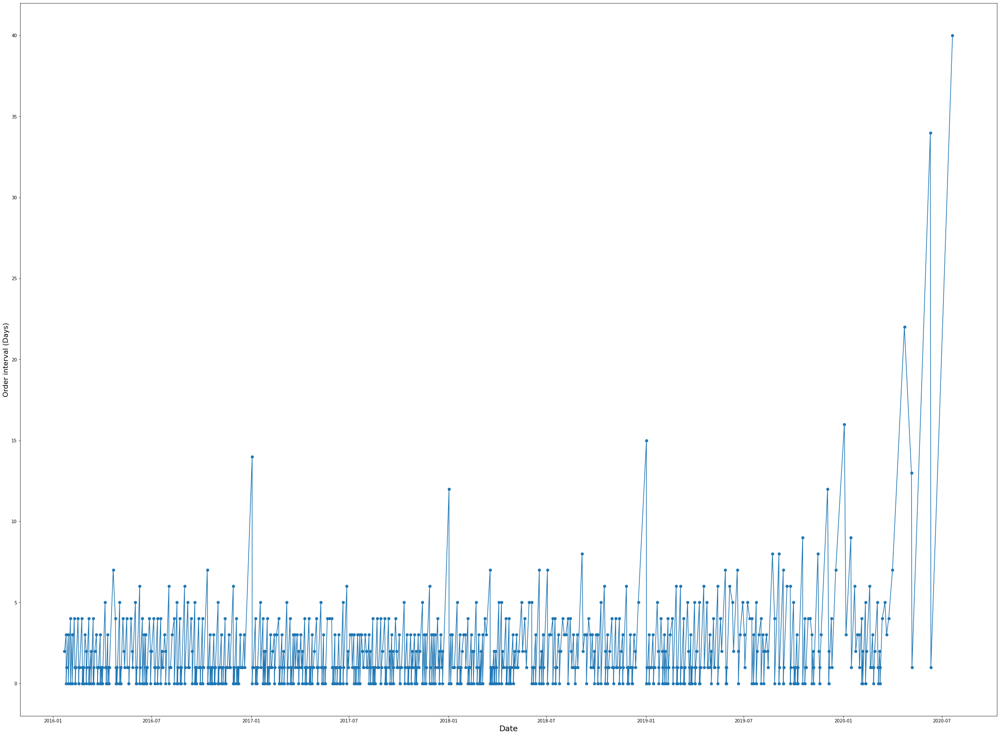

"GMT9572"
The mean is ：1.711759
The standard div is ：2.624062


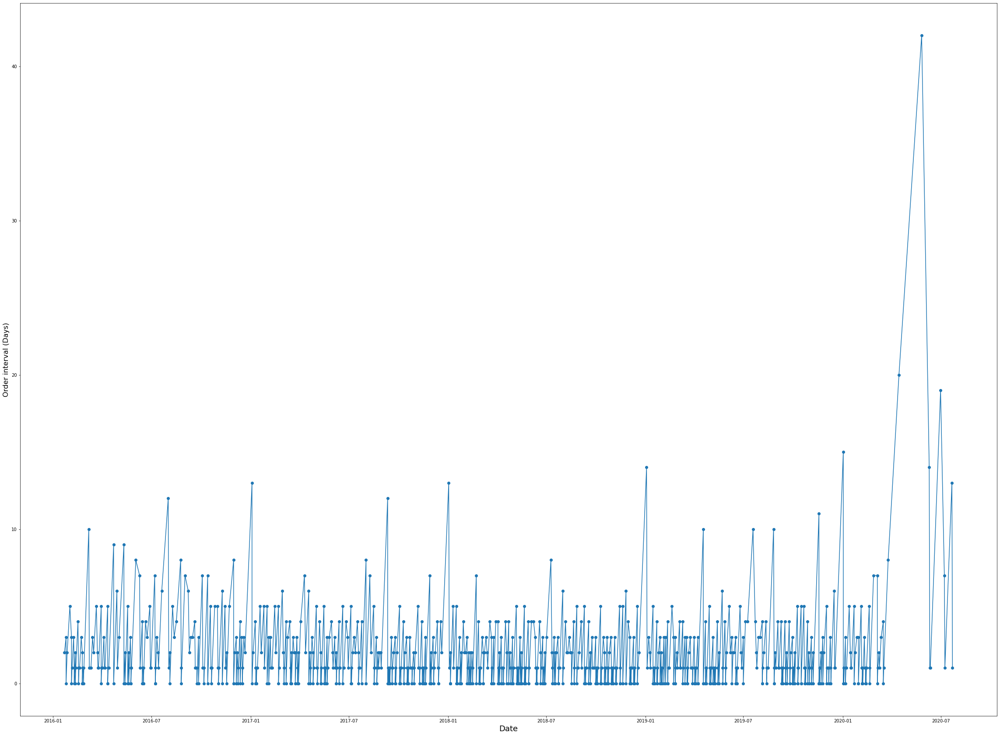

"GMT0845"
The mean is ：1.366556
The standard div is ：2.702214


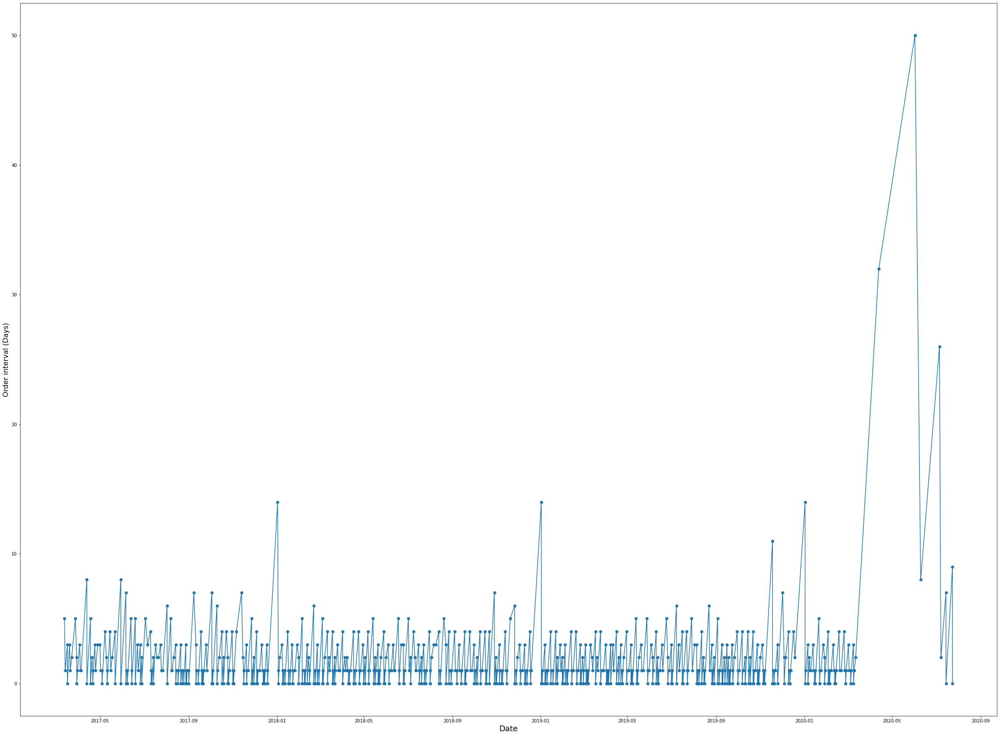

In [36]:
top10coffee=coffee_req1['upper part'].value_counts()[:10]._stat_axis.values.tolist()

def find_thecoffee_gap(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=coffee_req1[coffee_req1['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)

    
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    # print(a11)
    
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(a1[1:], a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()

find_thecoffee_gap(top10coffee)

### Top 10 consumed toner product and its order interval during 2016 - 2021, university wide

"HEWCE505A"
The mean is ：5.145570
The standard div is ：7.125748


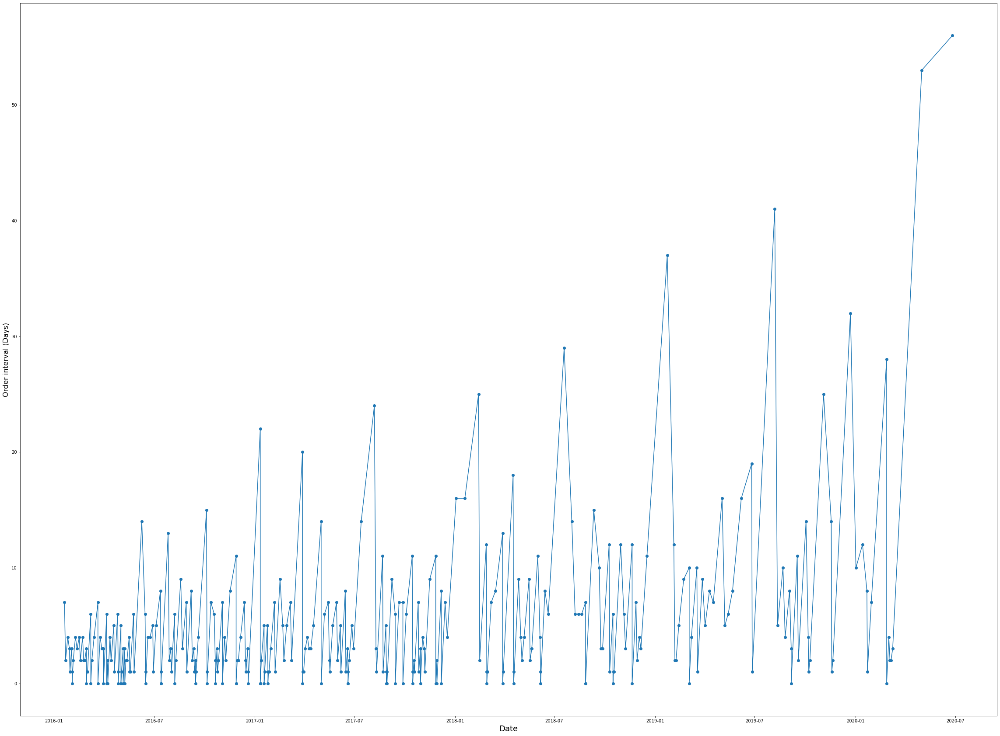

"HEWCN045AN"
The mean is ：5.672535
The standard div is ：6.151991


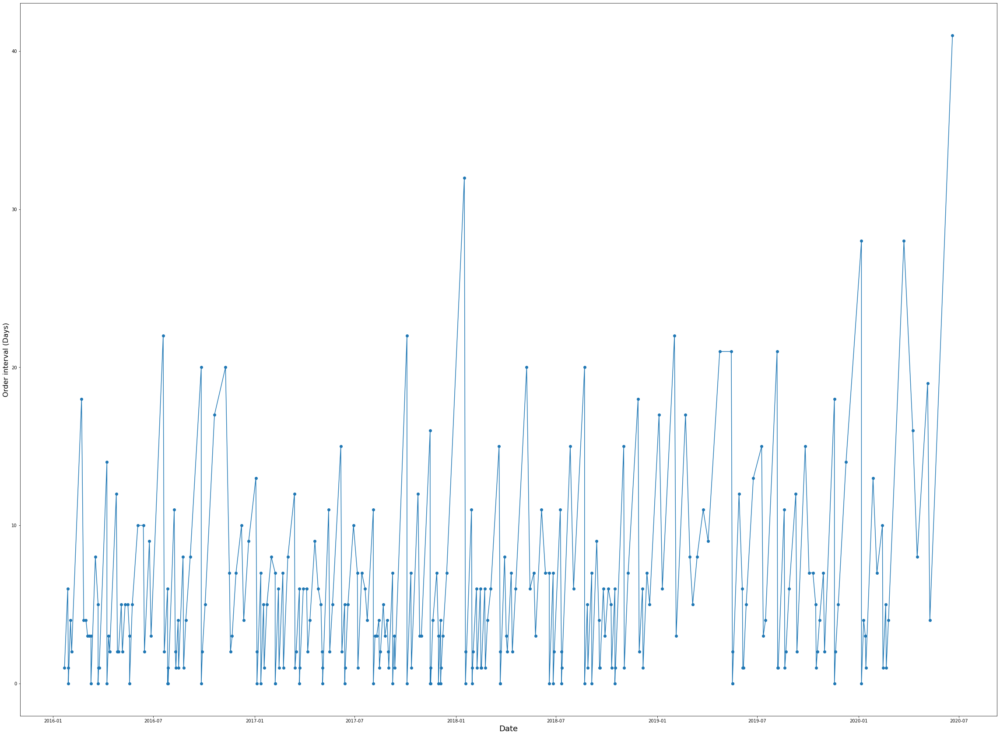

"HEWCR314FN"
The mean is ：5.692580
The standard div is ：6.263996


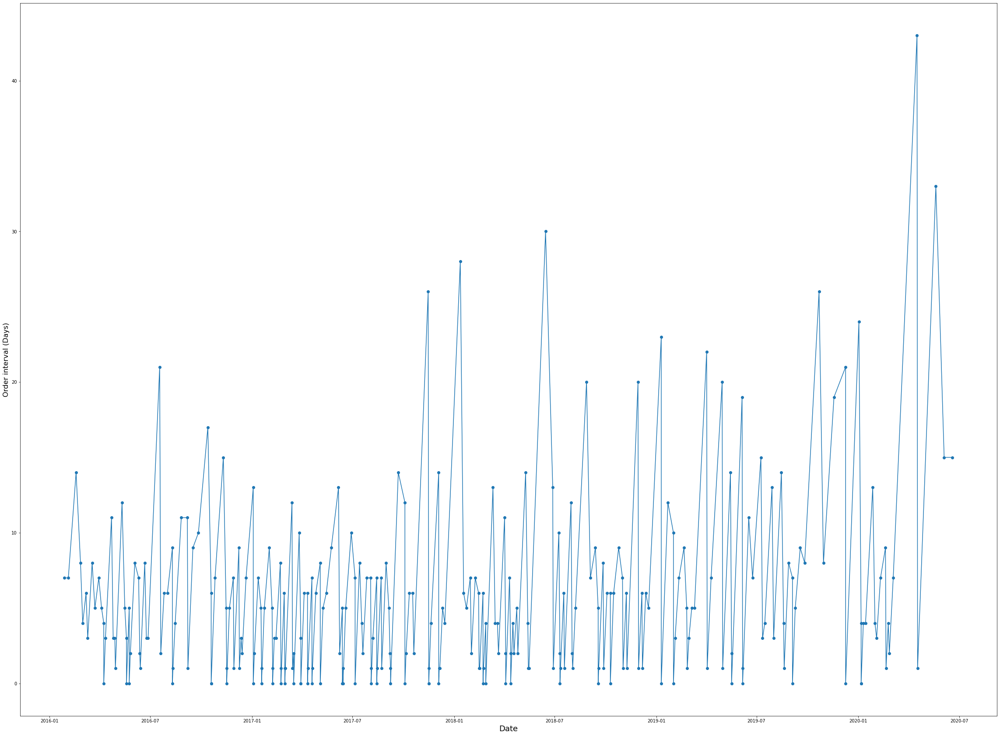

"DXE2342PATH"
The mean is ：5.811388
The standard div is ：6.382528


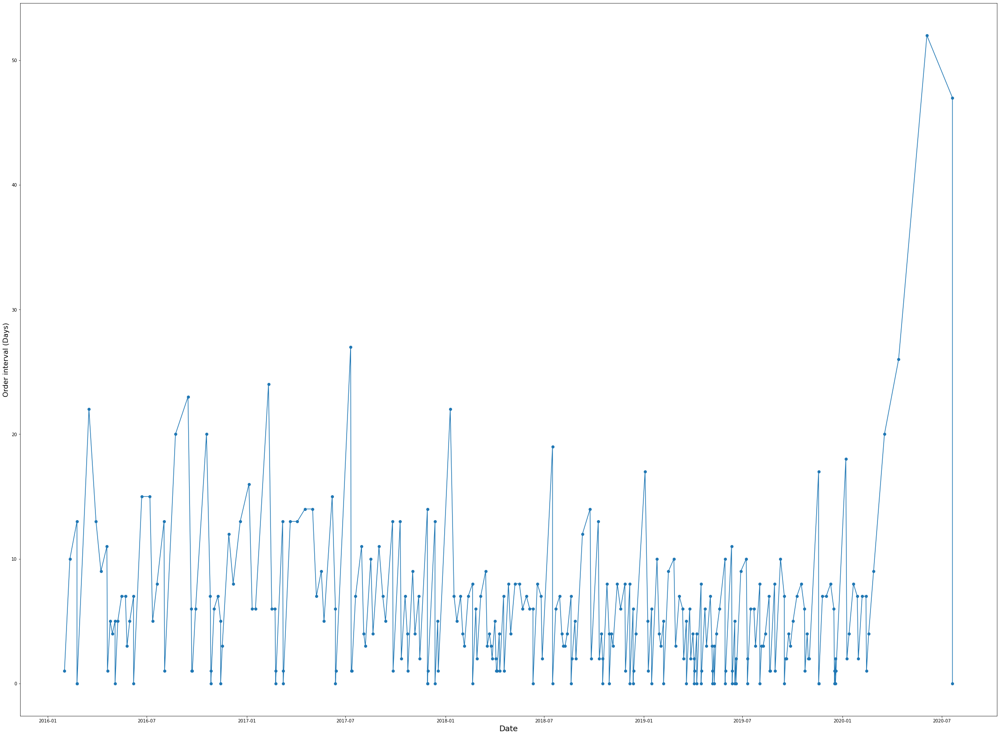

"HEWCE410A"
The mean is ：6.443137
The standard div is ：9.135349


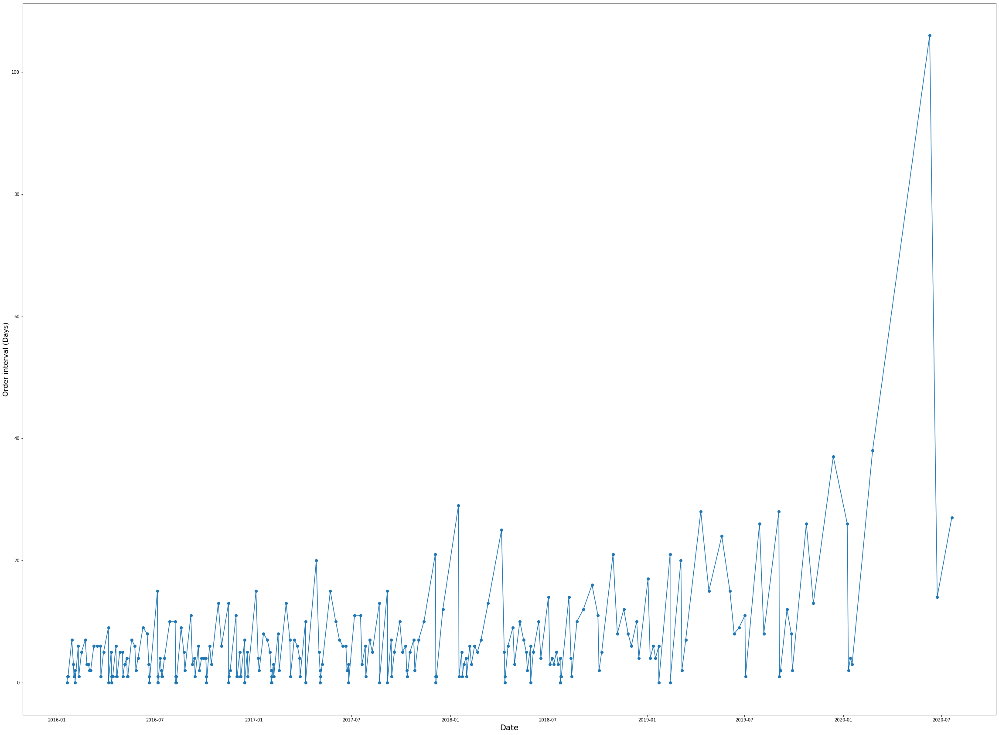

"HEWCF280A"
The mean is ：7.519417
The standard div is ：8.134614


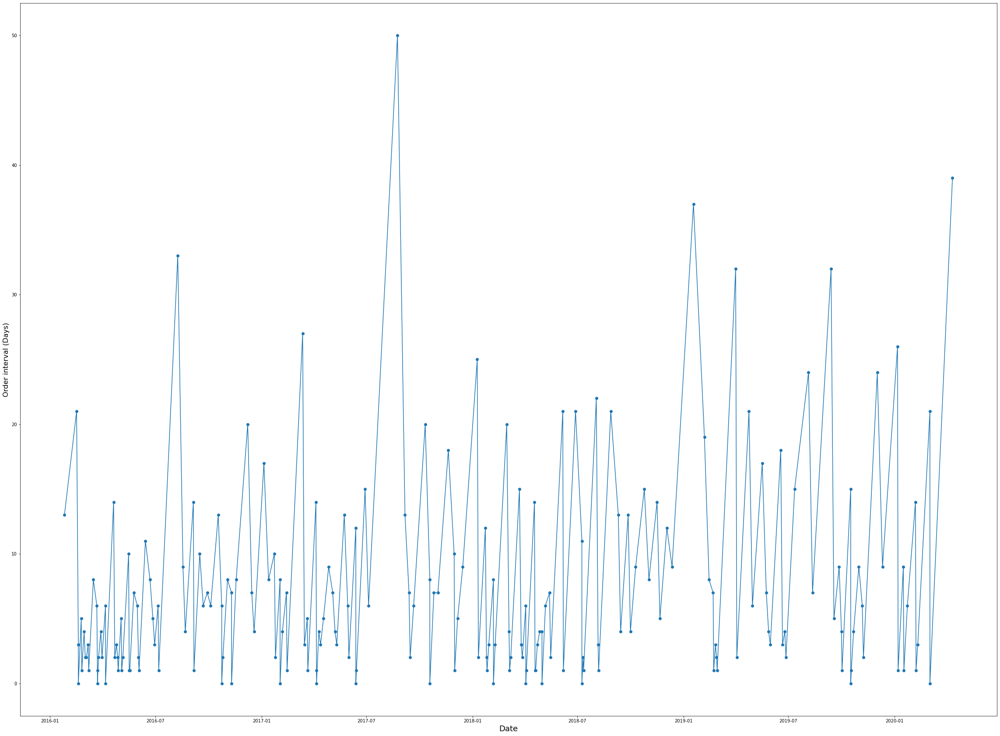

"HEWCF410A"
The mean is ：8.129353
The standard div is ：9.431248


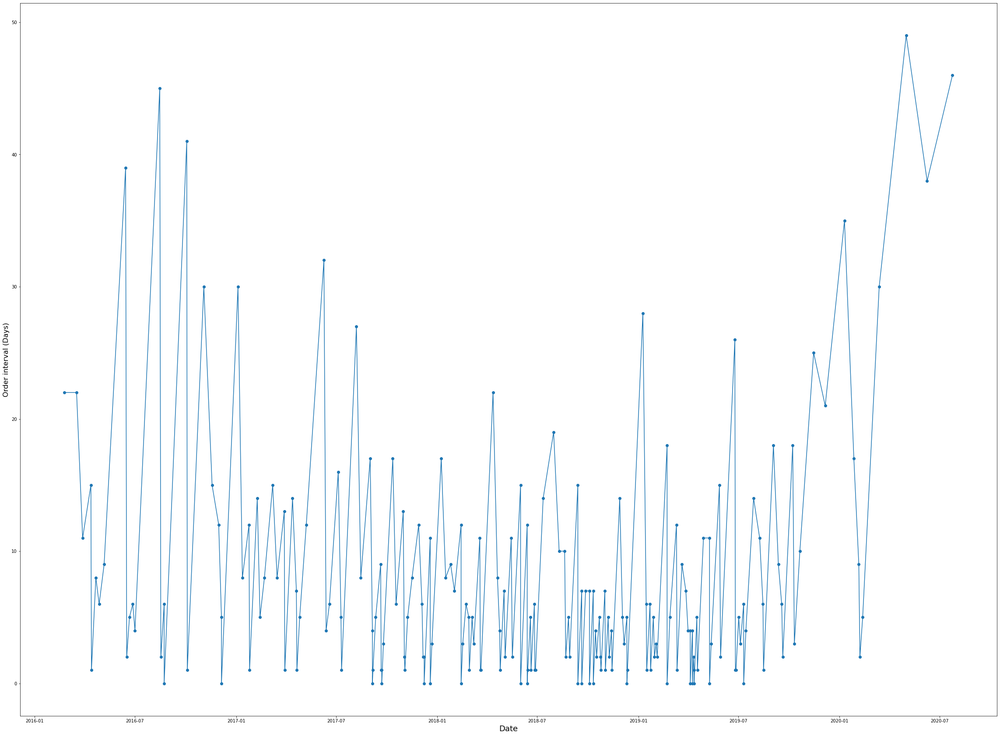

"HEWCE278A"
The mean is ：8.505376
The standard div is ：10.112404


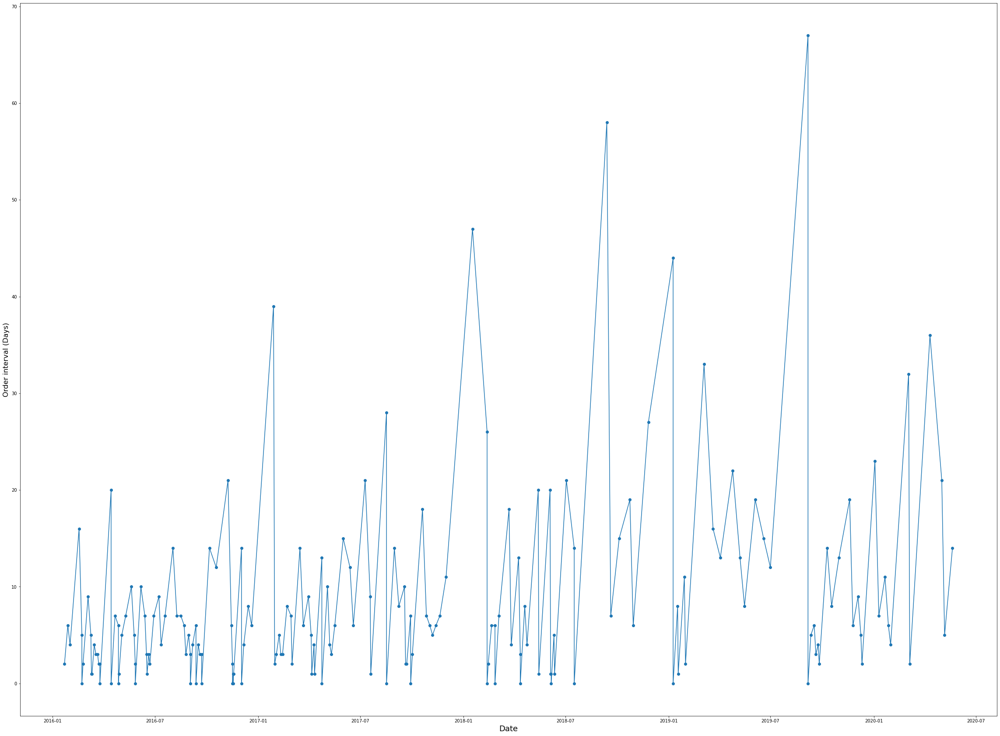

"HEWCE412A"
The mean is ：9.282486
The standard div is ：13.594589


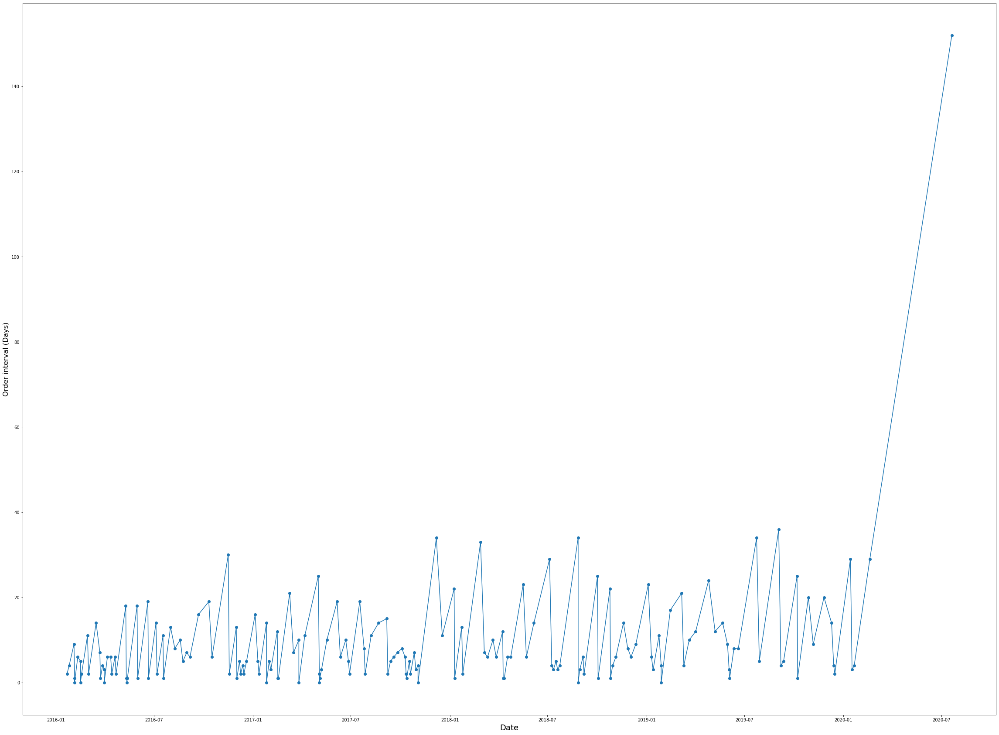

"HEWCE411A"
The mean is ：9.282486
The standard div is ：13.213988


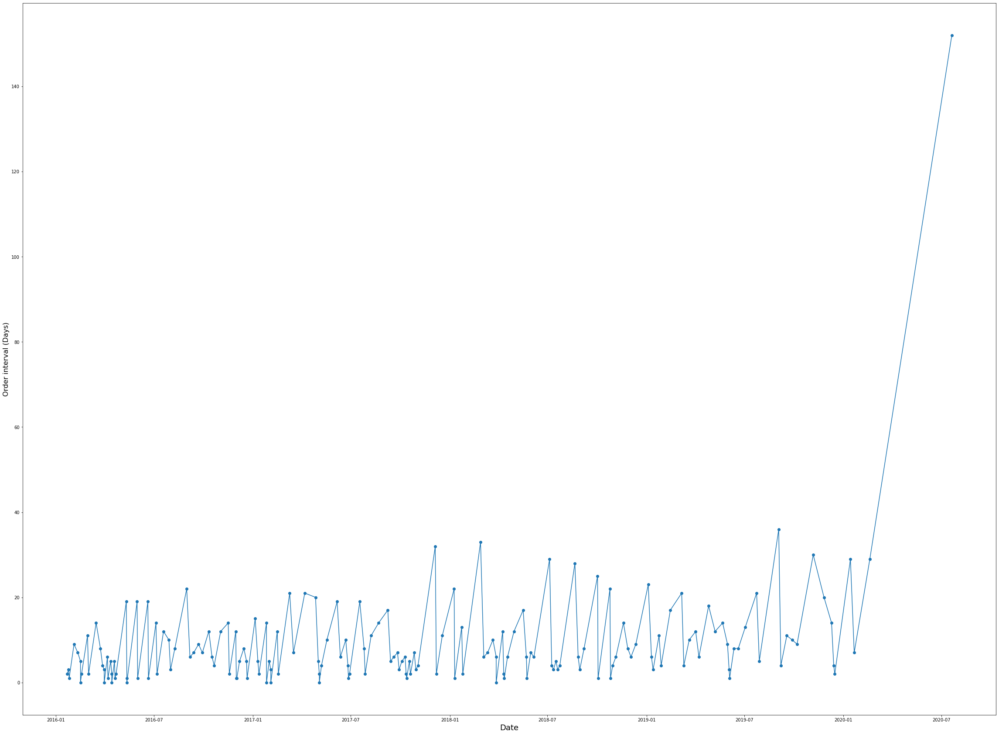

In [31]:
top10toner=toner_req1['upper part'].value_counts()[:10]._stat_axis.values.tolist()

def find_thetoner_gap(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=toner_req1[toner_req1['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(a1[1:], a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()

find_thetoner_gap(top10toner)

### Top 5 consumed coffee product and its order interval during 2016 - 2021,  categorized by top 5 most frequent ordered department

"GMT6520"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：6.388235
The standard div is ：8.479402
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：14.770000
The standard div is ：15.306766
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：20.208333
The standard div is ：25.827385
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：15.423077
The standard div is ：15.905788
"ADMINISTRATIVE SERVICES"
The mean is ：10.953020
The standard div is ：12.672613


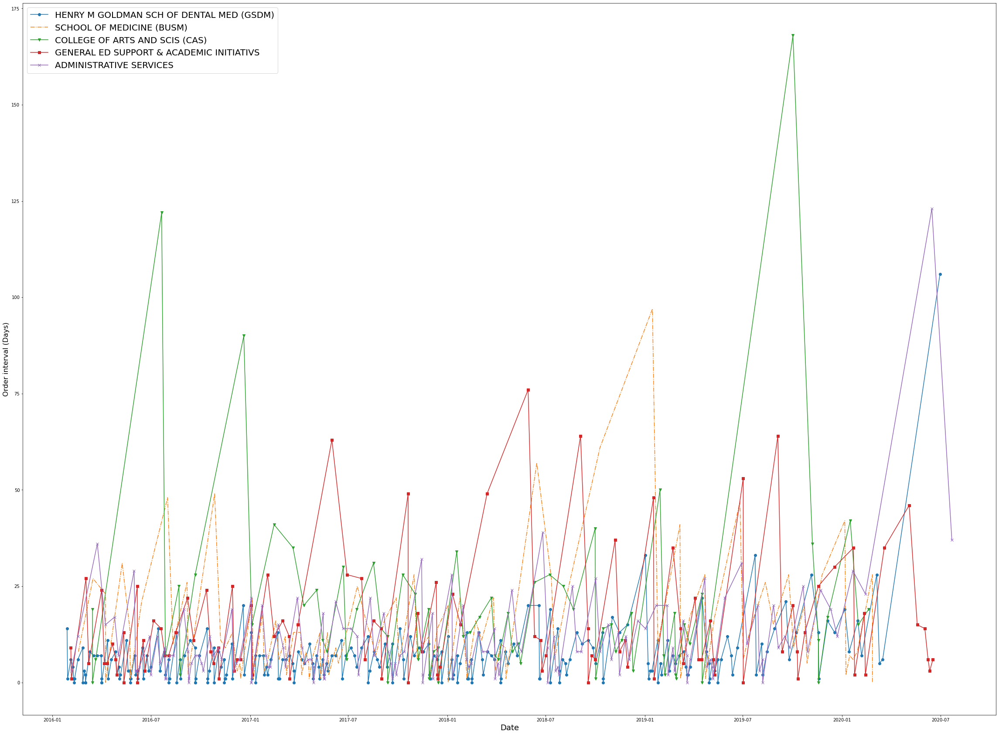

"GMT4061"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：9.078788
The standard div is ：12.439423
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：12.571429
The standard div is ：9.750304
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：12.944444
The standard div is ：15.865659
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：7.597156
The standard div is ：6.700342
"ADMINISTRATIVE SERVICES"
The mean is ：18.592593
The standard div is ：17.096515


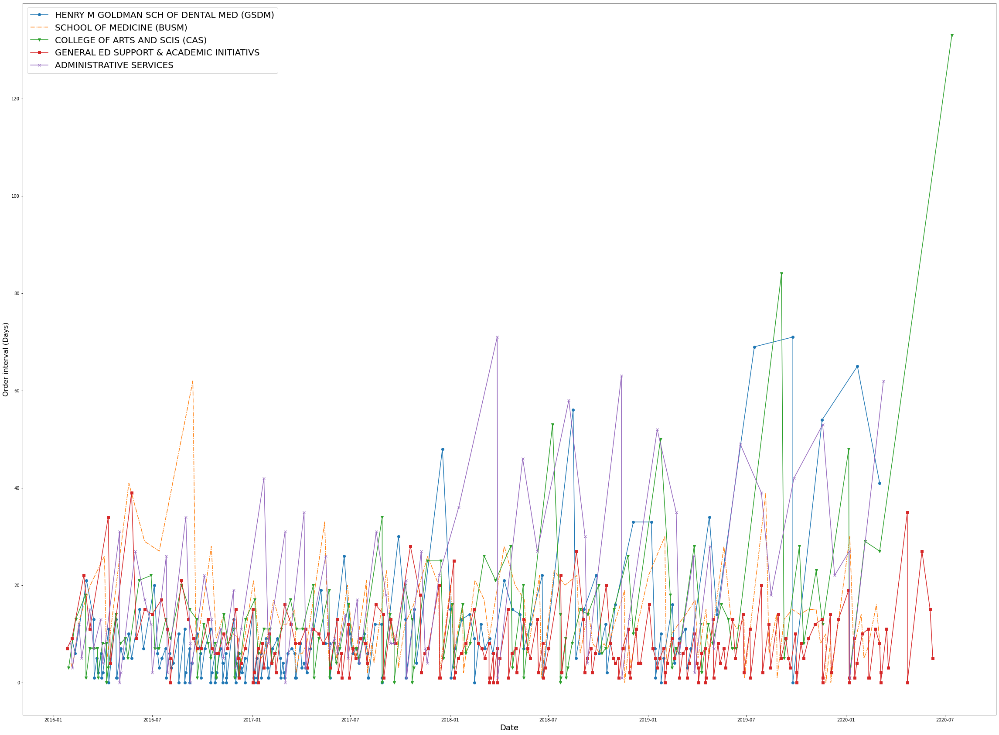

"GMT6663"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：6.081301
The standard div is ：5.267778
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：23.876923
The standard div is ：42.026917
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：20.602740
The standard div is ：24.937038
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：10.550000
The standard div is ：11.150480
"ADMINISTRATIVE SERVICES"
The mean is ：25.625000
The standard div is ：22.595284


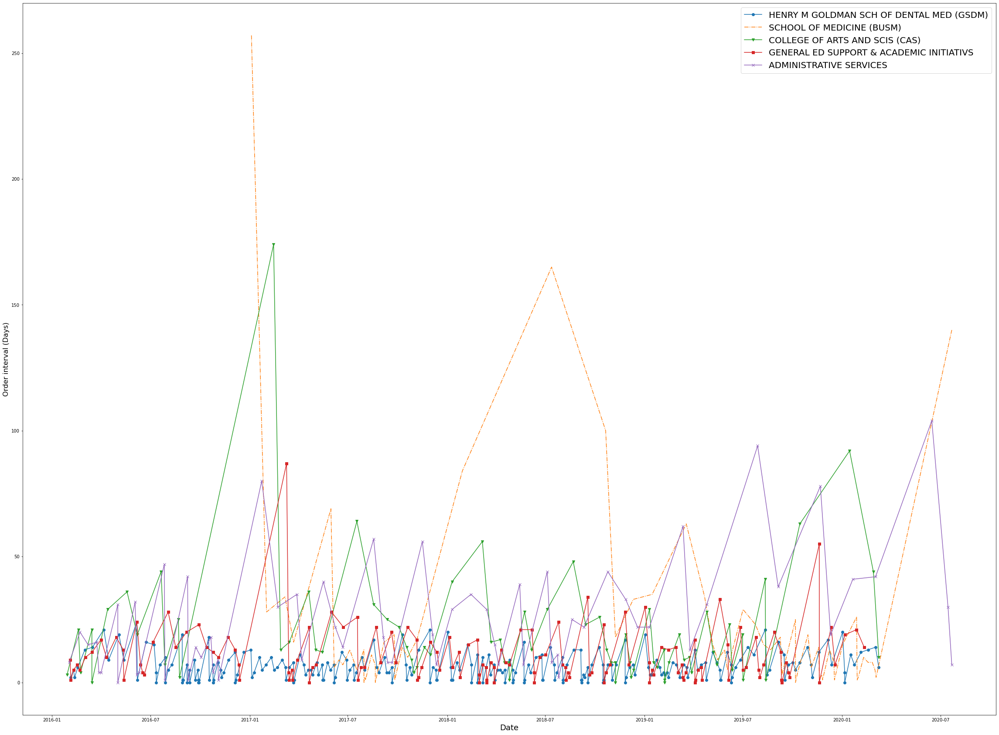

"NES35110BX"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：8.391753
The standard div is ：8.527768
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：14.482143
The standard div is ：17.940866
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：17.786517
The standard div is ：19.729332
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：10.203822
The standard div is ：9.004414
"ADMINISTRATIVE SERVICES"
The mean is ：47.735294
The standard div is ：52.144770


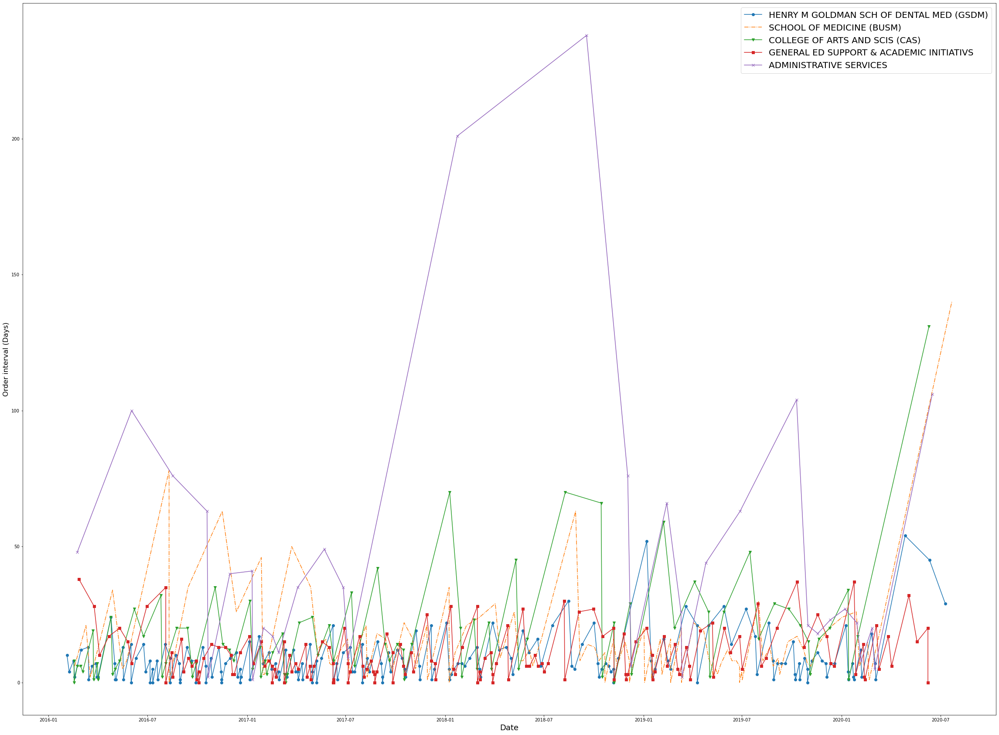

"GMT6732"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：29.836735
The standard div is ：36.744205
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：16.340000
The standard div is ：18.320055
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：37.333333
The standard div is ：24.669439
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：68.086957
The standard div is ：47.158302
"ADMINISTRATIVE SERVICES"
The mean is ：37.976190
The standard div is ：33.357007


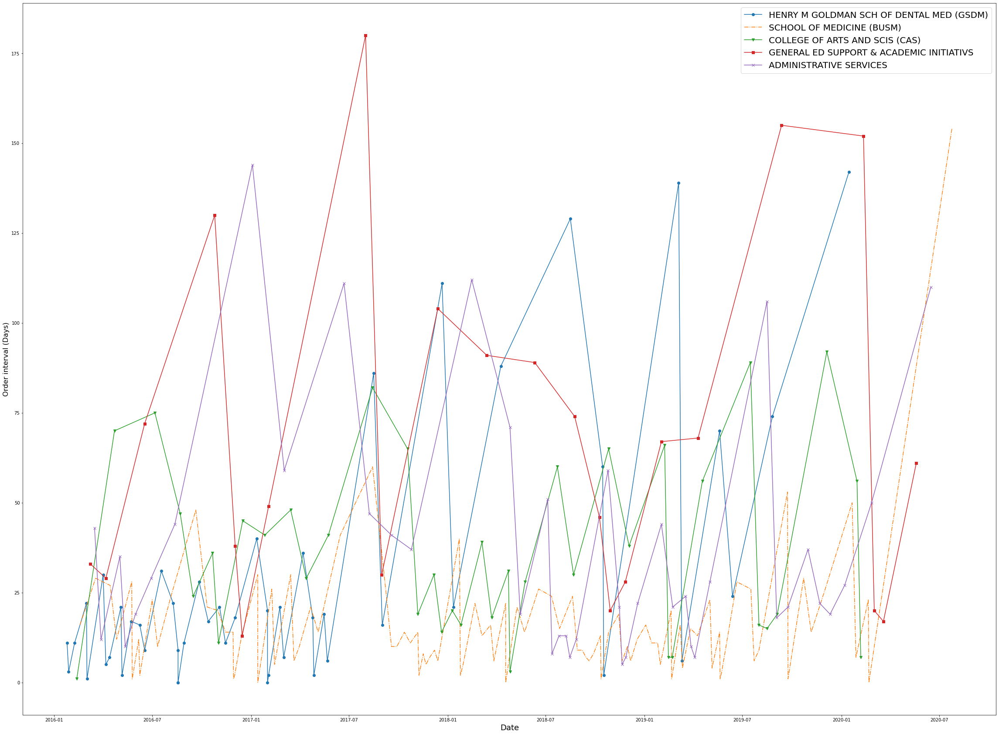

In [32]:
top10coffee=coffee_req1['upper part'].value_counts()[:5]._stat_axis.values.tolist()
top10toner=toner_req1['upper part'].value_counts()[:5]._stat_axis.values.tolist()

top10dep=coffee_req1['Unit name'].value_counts()[:5]._stat_axis.values.tolist()
top10dep2=toner_req1['Unit name'].value_counts()[:5]._stat_axis.values.tolist()

mark=['-o','-.','-v','-s','-x']

def find_thecoffee_gap2(name,dep):
  for h in name:
    print('"{0}"'.format(h))
    for l in range(len(dep)): 
      print('"{0}"'.format(dep[l]))
      temp = coffee_req1[coffee_req1['Unit name'] == dep[l]]
      a1=temp[temp['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
      # print(a1)
      a1 = sorted(a1)

    
      a11 = []
      for i in range(len(a1)-1):
        a11.append((a1[i+1]-a1[i]).days)
      # print(a11)
    
      arr_mean=(np.mean(a11))
      arr_std=(np.std(a11))

      print("The mean is ：%f" % arr_mean)

      print("The standard div is ：%f" % arr_std)
      plt.plot(a1[1:], a11, mark[l])
      plt.rcParams["figure.figsize"] = (40,30)
    plt.legend(dep,prop={'size': 20})
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()

find_thecoffee_gap2(top10coffee,top10dep)

### Top 5 consumed toner product and its order interval during 2016 - 2021,  categorized by top 5 most frequent ordered department

"HEWCE505A"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：46.906250
The standard div is ：55.370547
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：41.750000
The standard div is ：35.896746
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：14.201754
The standard div is ：16.718086
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：nan
The standard div is ：nan
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：220.666667
The standard div is ：232.811559


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


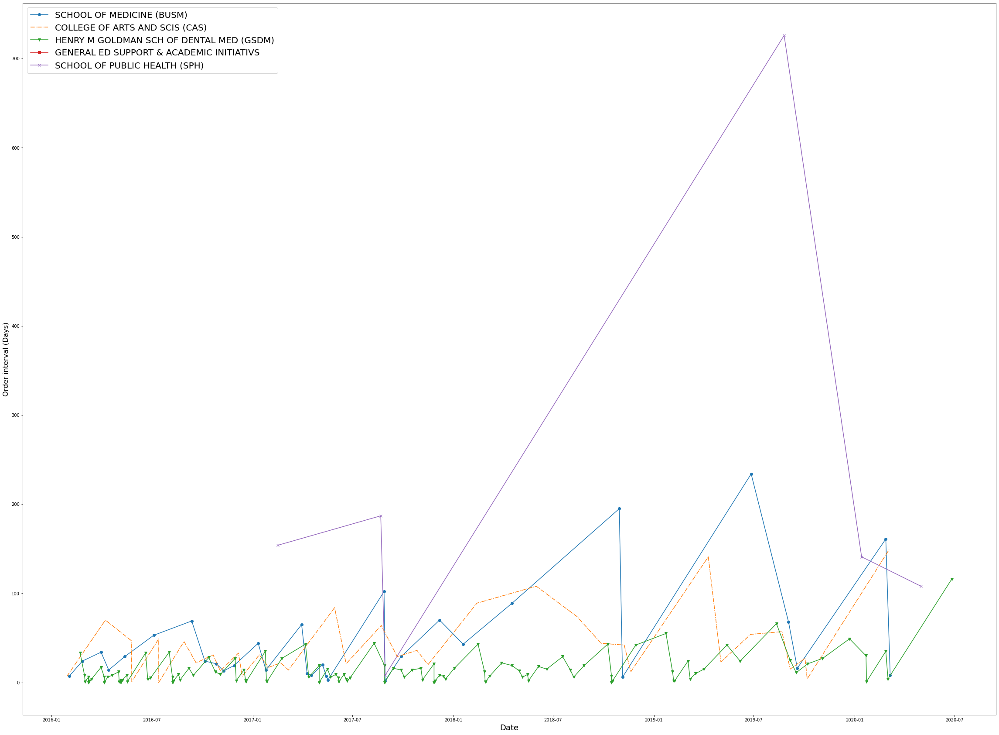

"HEWCN045AN"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：27.169492
The standard div is ：28.006145
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：96.133333
The standard div is ：85.192227
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：23.174603
The standard div is ：19.579338
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：60.833333
The standard div is ：43.024864
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：174.750000
The standard div is ：178.737062


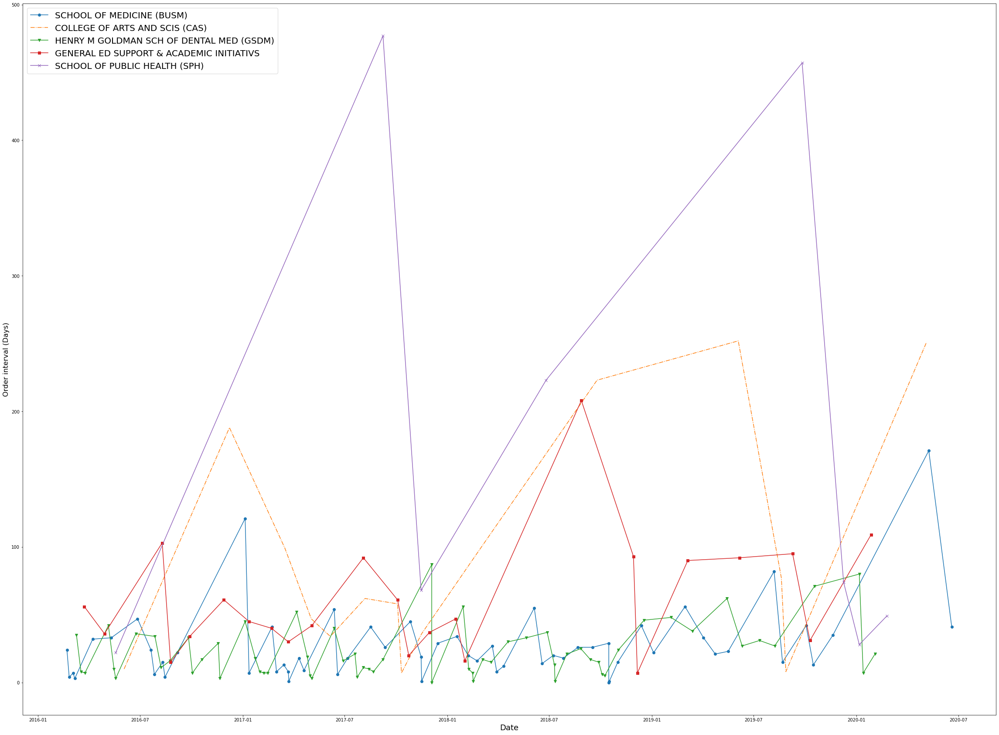

"HEWCR314FN"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：34.239130
The standard div is ：38.382052
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：37.416667
The standard div is ：35.916087
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：25.568966
The standard div is ：24.475260
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：81.105263
The standard div is ：57.622999
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：196.571429
The standard div is ：215.741815


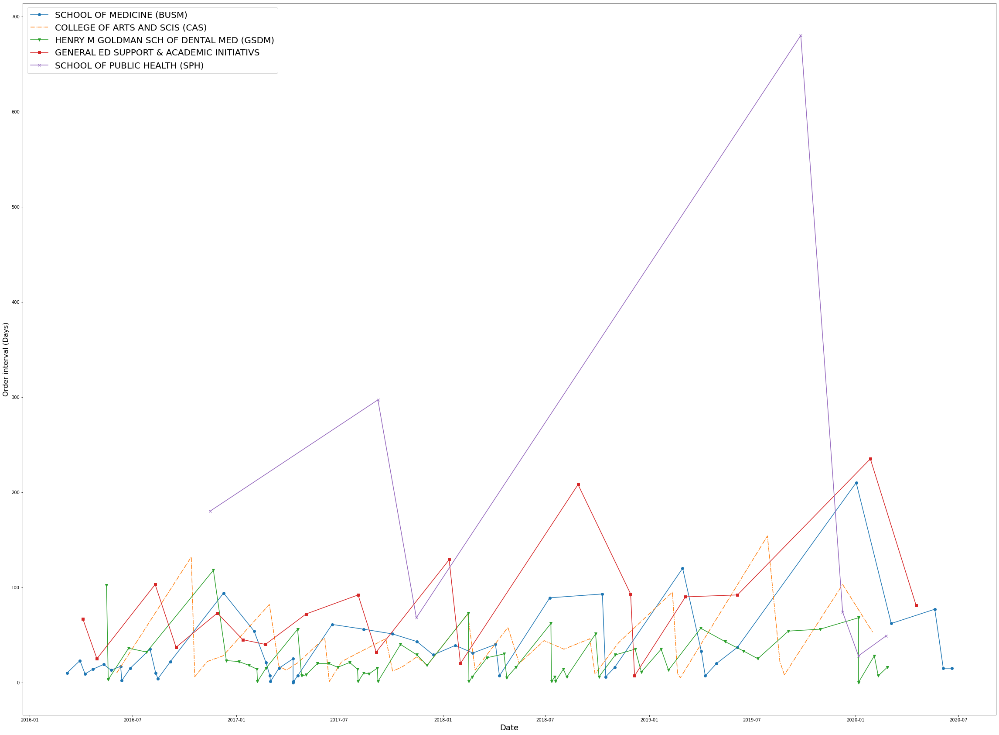

"DXE2342PATH"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：80.117647
The standard div is ：89.631850
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：175.625000
The standard div is ：114.646127
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：57.727273
The standard div is ：27.914125
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：204.125000
The standard div is ：167.157439
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：194.500000
The standard div is ：129.600347


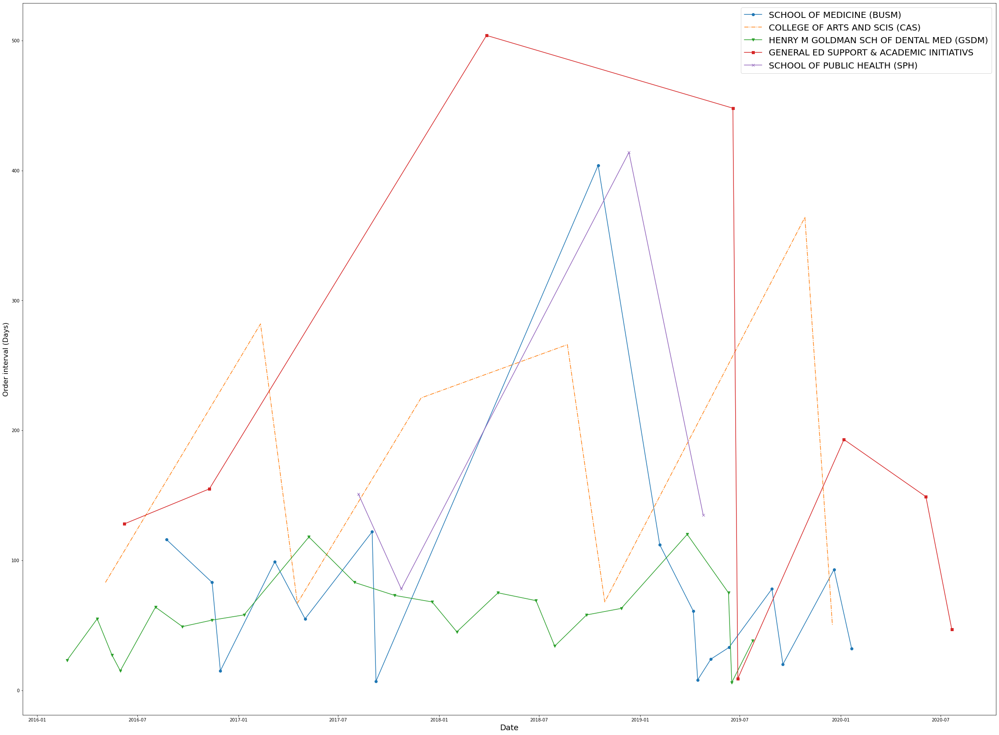

"HEWCE410A"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：22.136986
The standard div is ：31.812514
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：49.593750
The standard div is ：49.588847
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：88.166667
The standard div is ：96.373838
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：67.684211
The standard div is ：78.786221
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：45.060606
The standard div is ：53.689872


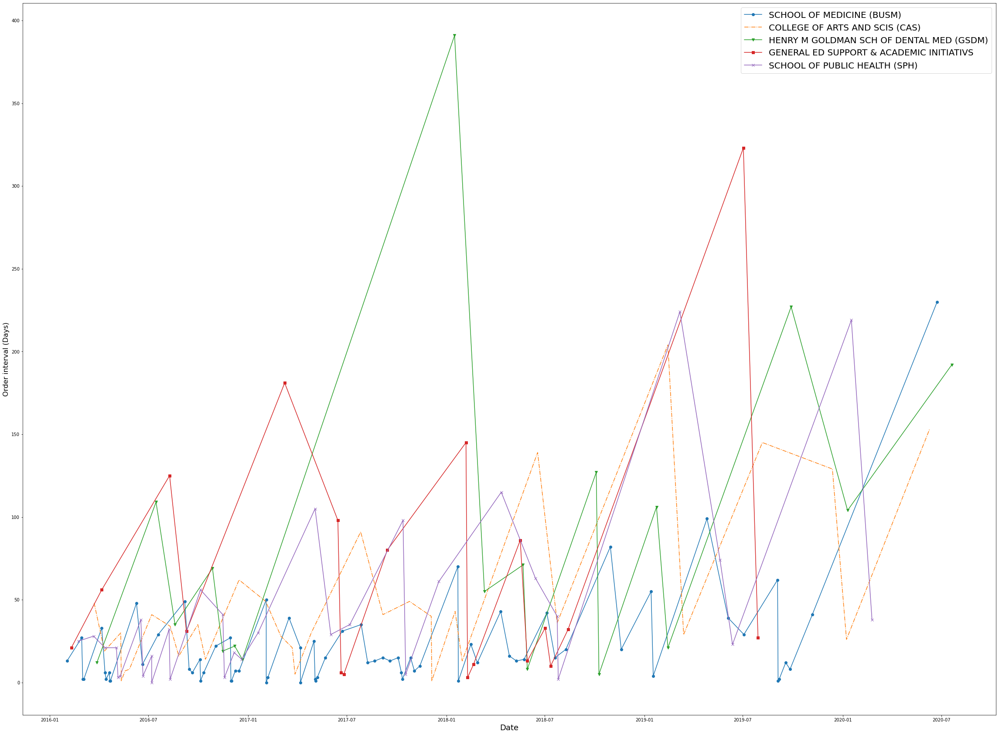

In [33]:
def find_thetoner_gap2(name,dep):
  for h in name:
    print('"{0}"'.format(h))
    for l in range(len(dep)): 
      print('"{0}"'.format(dep[l]))
      temp = toner_req1[toner_req1['Unit name'] == dep[l]]
      a1=temp[temp['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
      # print(a1)
      a1 = sorted(a1)

    
      a11 = []
      for i in range(len(a1)-1):
        a11.append((a1[i+1]-a1[i]).days)
      # print(a11)
    
      arr_mean=(np.mean(a11))
      arr_std=(np.std(a11))

      print("The mean is ：%f" % arr_mean)

      print("The standard div is ：%f" % arr_std)
      plt.plot(a1[1:], a11, mark[l])
      plt.rcParams["figure.figsize"] = (40,30)
    plt.legend(dep,prop={'size': 20})
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()



find_thetoner_gap2(top10toner,top10dep2)

### Top 10 consumed paper product and its order interval during 2016 - 2021, university wide

"FIREWORX Colored Paper"
<class 'list'>
{0, 1, 2, 3, 4, 5, 6, 7, 8, 194, 9}
The mean is ：1.115479
The standard div is ：9.687446


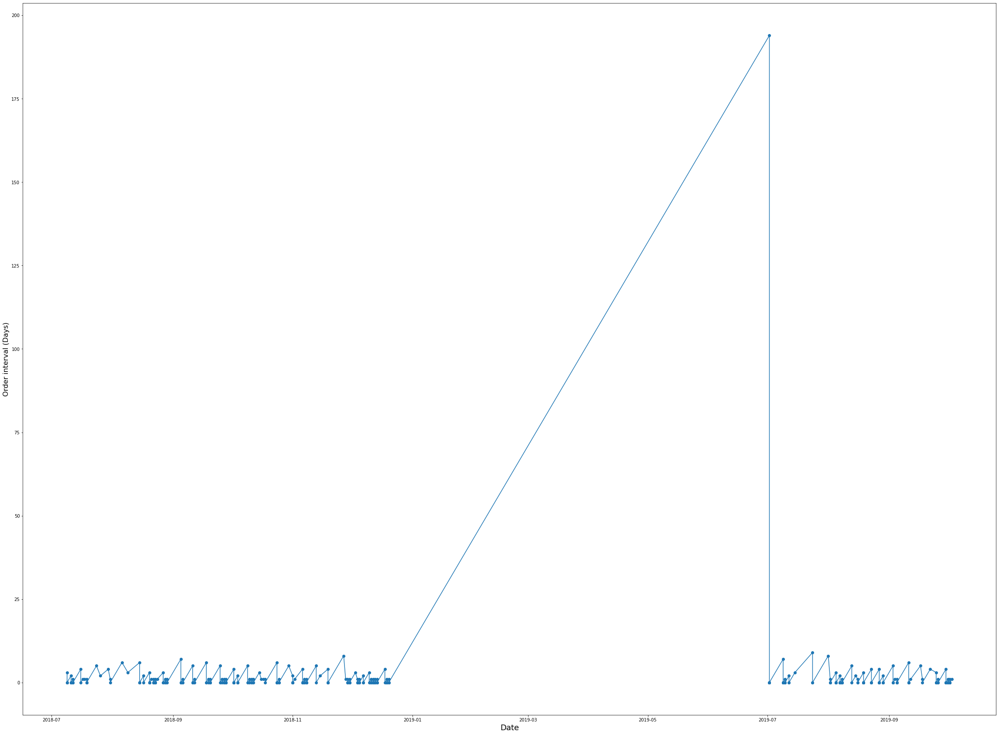

"Copy Plus Copy Paper"
<class 'list'>
{0, 4, 11, 77, 16, 113, 20, 22, 223}
The mean is ：54.000000
The standard div is ：69.490207


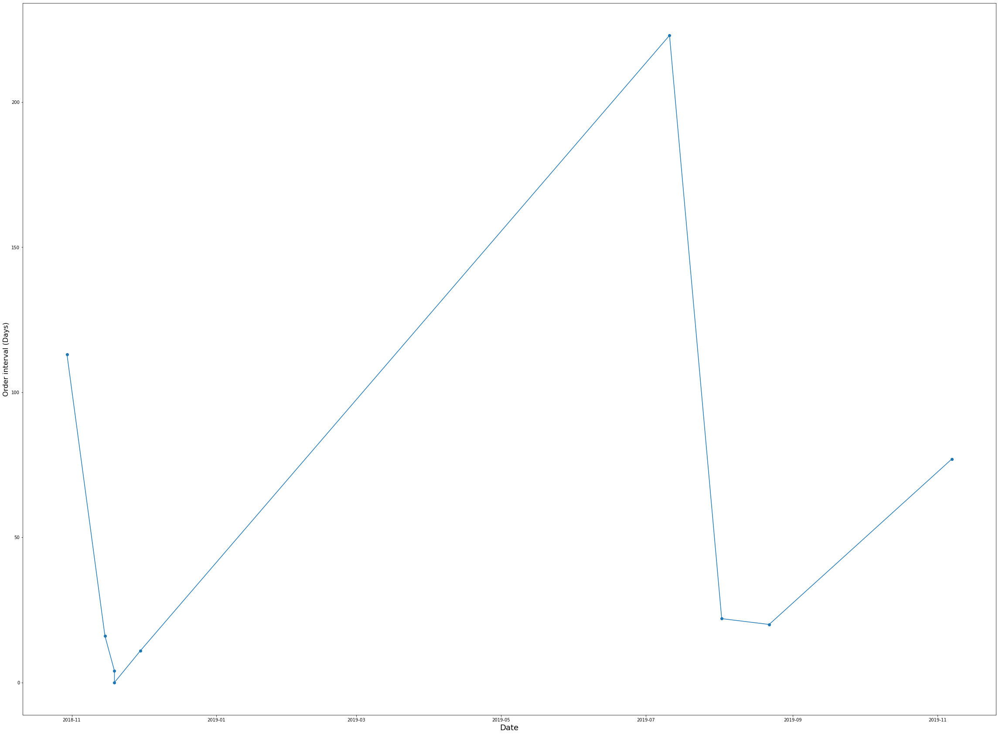

"Premium Color Copy Paper"
<class 'list'>
{0, 33, 2, 36, 68, 6, 50, 287}
The mean is ：53.555556
The standard div is ：85.702471


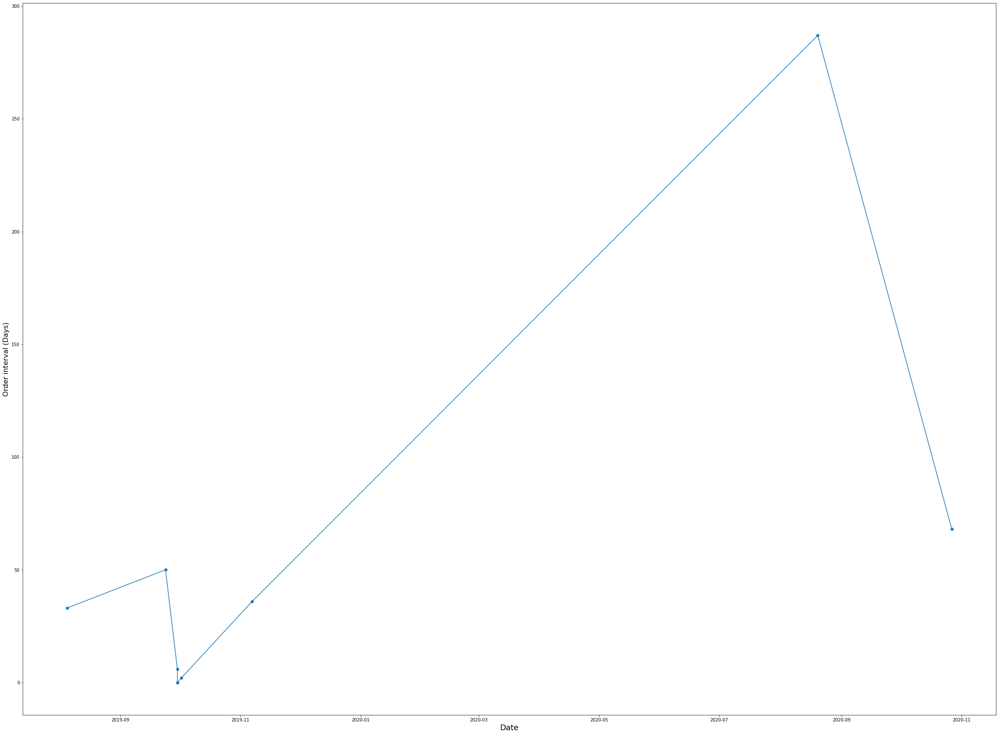

"BriteHue Multipurpose Colored Paper"
<class 'list'>
{0, 49, 1}
The mean is ：8.333333
The standard div is ：18.190352


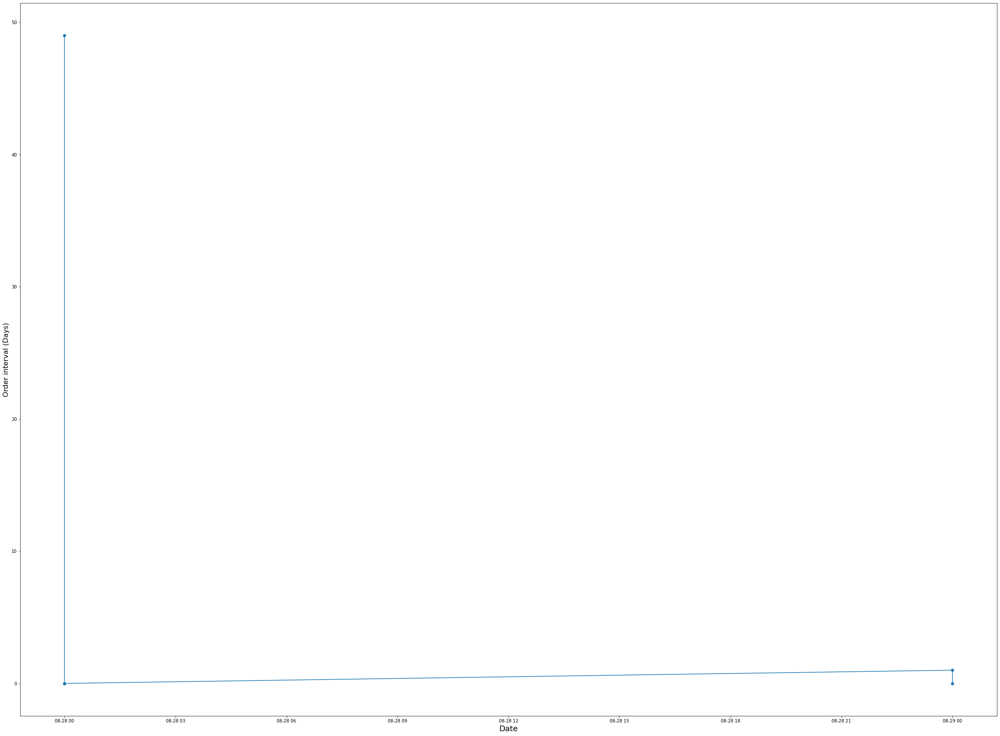

"Copy Paper"
<class 'list'>
{0, 1, 2, 3, 4, 5, 6, 7, 8, 11, 17, 22, 287, 33, 36, 42, 65, 67, 210}
The mean is ：30.035714
The standard div is ：64.155771


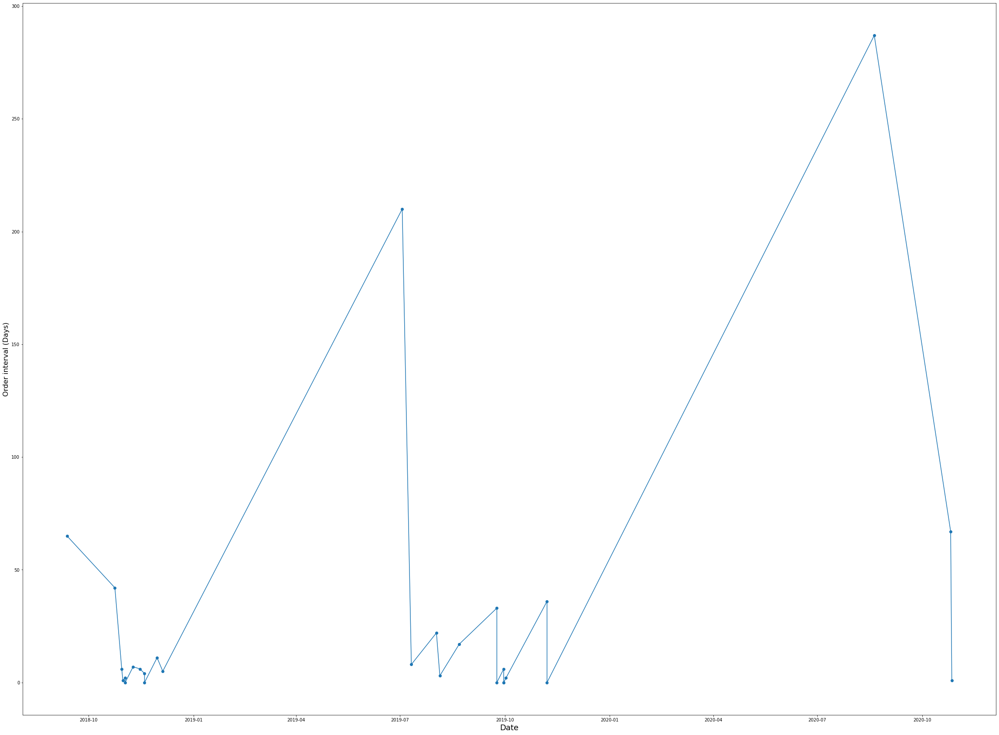

"Fore MP Multipurpose Paper"
<class 'list'>
{304, 57, 13, 33}
The mean is ：84.000000
The standard div is ：111.186330


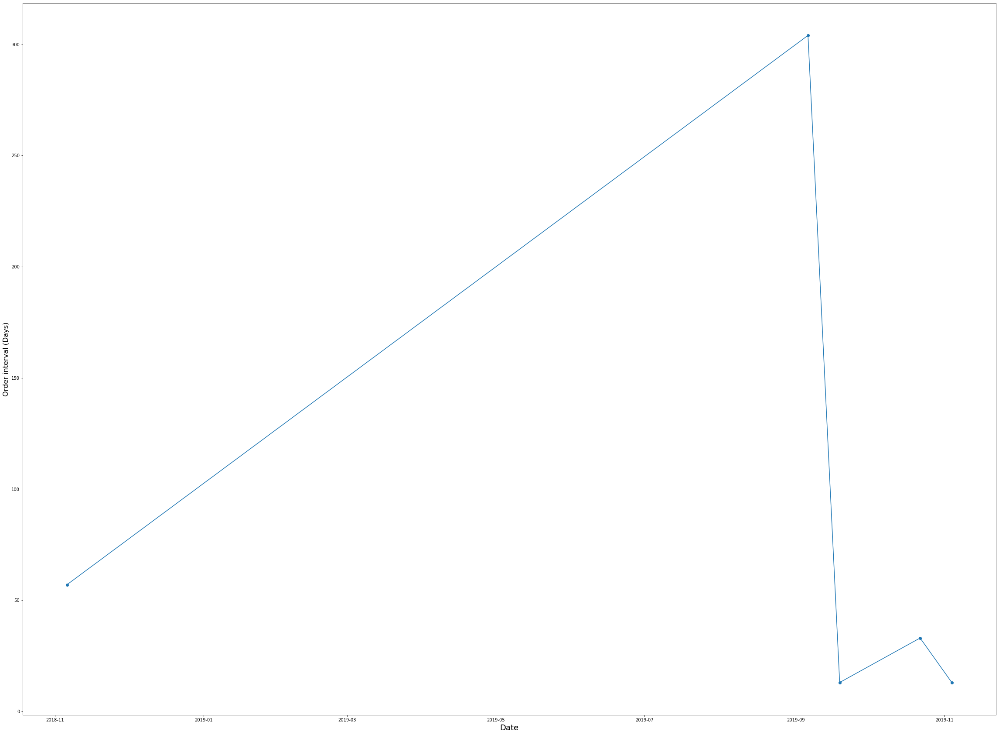

"Recycled Colored Paper"
<class 'list'>
{352, 126}
The mean is ：239.000000
The standard div is ：113.000000


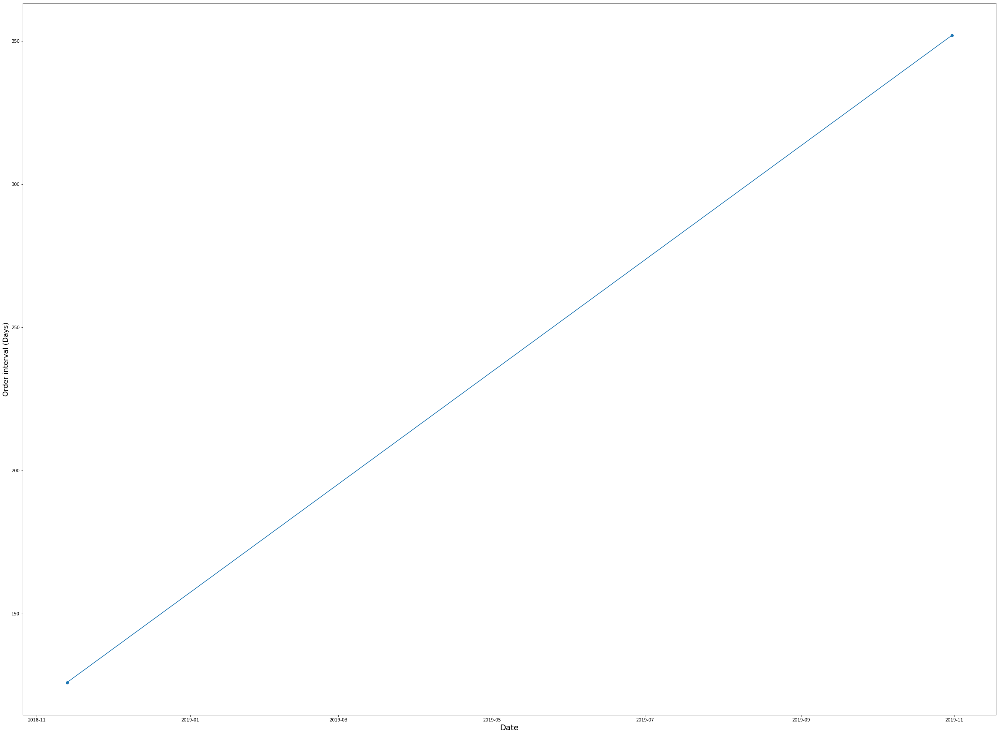

"Great White 30 Recycled Copy Paper"
<class 'list'>
{398, 335}
The mean is ：366.500000
The standard div is ：31.500000


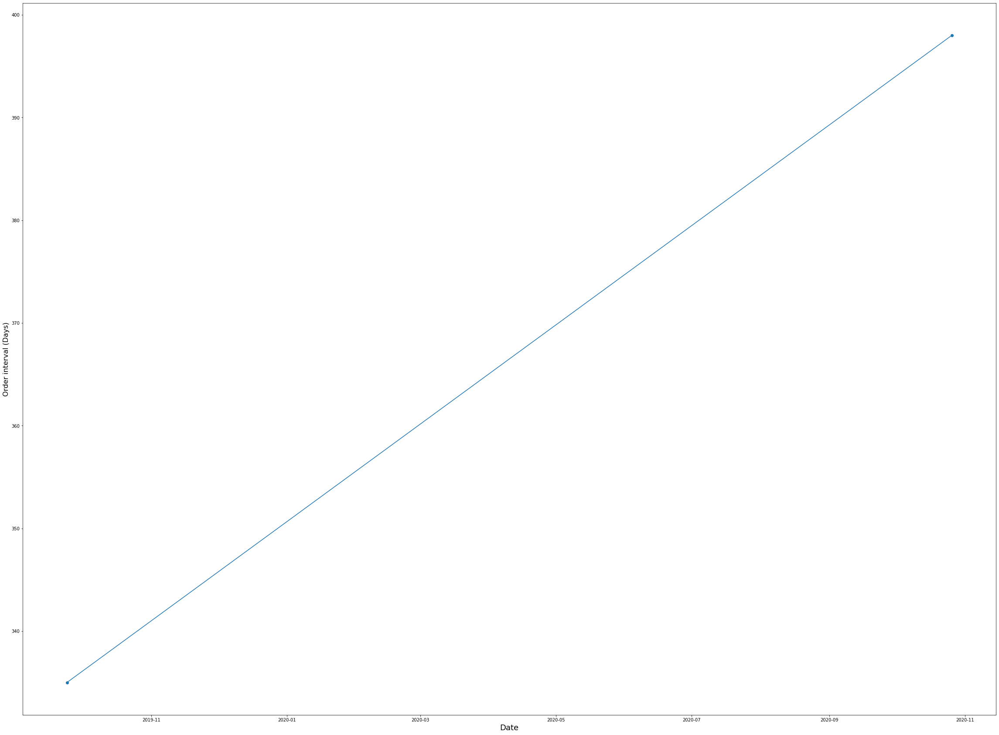

In [34]:
paper_name = paper_df['Description'].str.split('|', expand=True)[2].str.split(',', expand=True)[0].value_counts()._stat_axis.values.tolist()

def find_thepaper_gap(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=paper_df[paper_df['Description'].str.contains(h)]['Requisitioning Date'].tolist()
    print(type(a1))
    a1 = sorted(a1)

    
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    print(set(a11))
    
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(a1[1:], a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()

find_thepaper_gap(paper_name[:-3])

### Most consumed paper product and its order interval during 2016 - 2021,  categorized by top 5 most frequent ordered department

"FIREWORX Colored Paper"
"COLLEGE OF ARTS AND SCIS (CAS)"
{0, 1, 34, 3, 4, 5, 2, 7, 8, 6, 201, 12, 13, 19, 21, 22, 26}
The mean is ：5.309524
The standard div is ：22.421809
"SCHOOL OF MEDICINE (BUSM)"
{0, 1, 3, 4, 5, 7, 8, 41, 13, 14, 15, 16, 19, 20, 22, 246}
The mean is ：12.611111
The standard div is ：40.429141
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
{0, 1, 2, 3, 5, 7, 9, 11, 203, 14, 16, 18, 23, 24, 25, 26}
The mean is ：13.062500
The standard div is ：35.287159
"SCHOOL OF LAW (LAW)"
{0, 1, 3, 5, 231, 8, 9, 75}
The mean is ：11.482759
The standard div is ：43.685096
"QUESTROM SCHOOL OF BUSINESS (QST)"
{0, 1, 288, 35, 8, 14, 79, 18}
The mean is ：17.720000
The standard div is ：57.669763


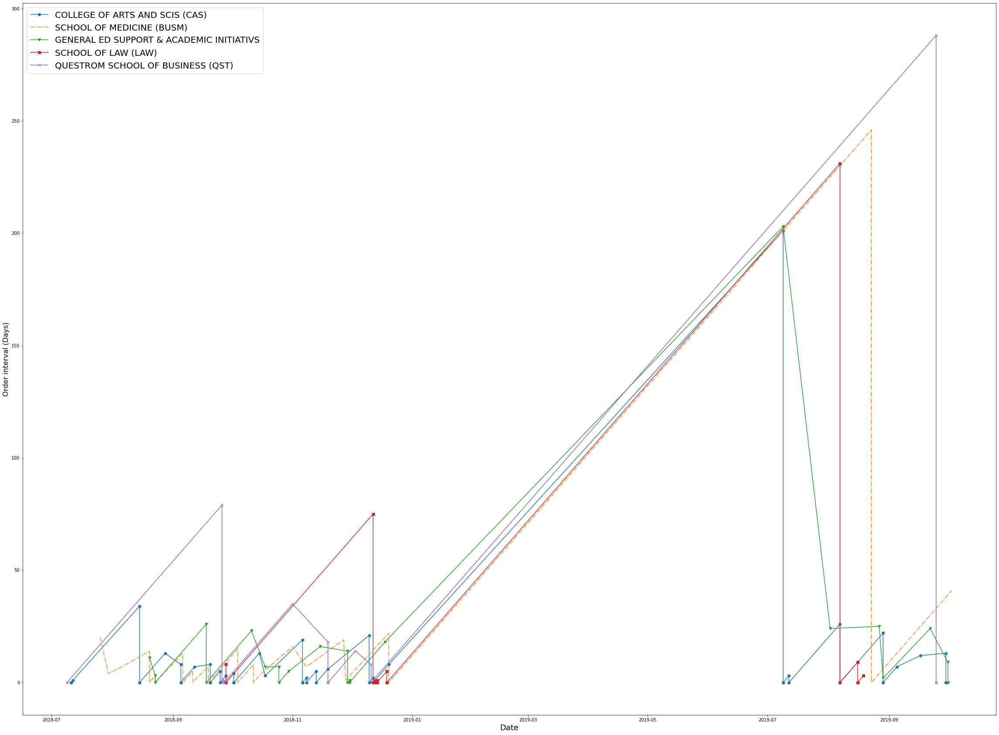

"FIREWORX Colored Paper"
"OFFICE OF THE UNIV CHAPLAIN"
{0, 5, 9, 14, 16, 49, 23, 26, 29, 222}
The mean is ：21.421053
The standard div is ：49.079223
"QST Copy Center"
{0, 288, 35, 8, 14, 80, 18}
The mean is ：19.260870
The standard div is ：59.934905
"CAS PHYSICS"
{0, 5, 8, 41, 204, 80, 29}
The mean is ：21.588235
The standard div is ：50.119925
"CAS ECONOMICS"
{0}
The mean is ：0.000000
The standard div is ：0.000000
"ATH WOMEN'S SOCCER"
{0, 27, 7}
The mean is ：2.615385
The standard div is ：7.280516


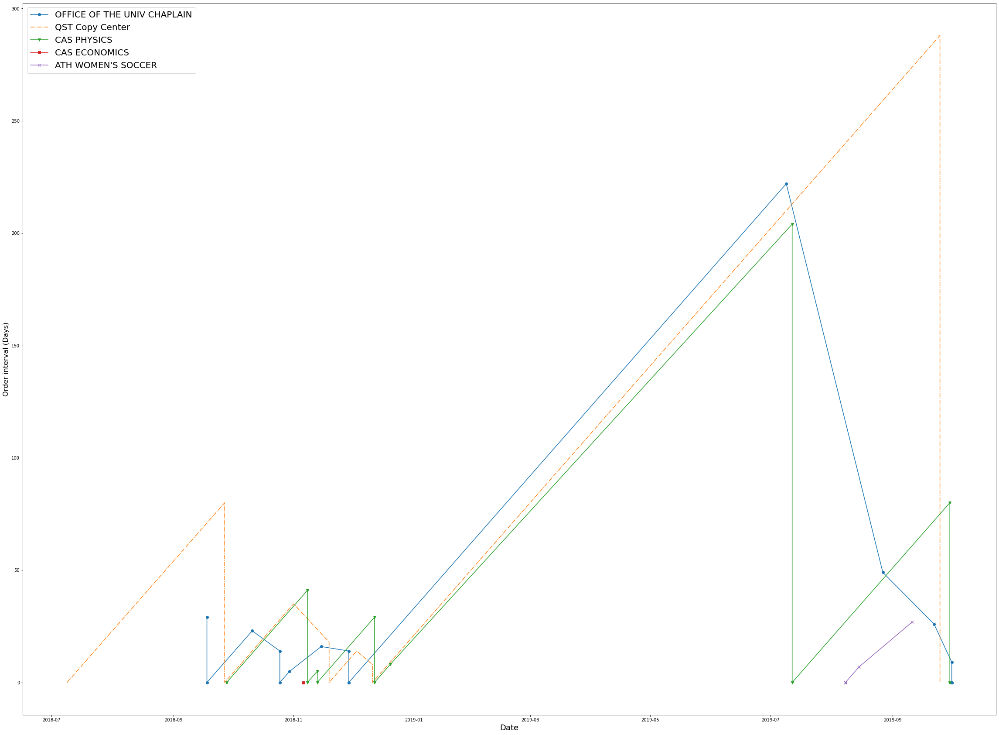

In [35]:
top5fc = paper_df[paper_df['fc name'] != 'no match to bus']['fc name'].value_counts()[:5]._stat_axis.values.tolist()
top5dep = paper_df[paper_df['Unit name'] != 'no match to bus']['Unit name'].value_counts()[:5]._stat_axis.values.tolist()

mark=['-o','-.','-v','-s','-x']

def find_thepaper_gap2(name, dep, sub):
  for h in name:
    print('"{0}"'.format(h))
    for l in range(len(dep)):
      print('"{0}"'.format(dep[l]))
      temp = paper_df[paper_df['Unit name'] == dep[l]]
      if sub:
        temp = paper_df[paper_df['fc name'] == dep[l]]
      
      a1=temp[temp['Description'].str.contains(h)]['Requisitioning Date'].tolist()
      # print(type(a1))
      a1 = sorted(a1)

    
      a11 = []
      for i in range(len(a1)-1):
        a11.append((a1[i+1]-a1[i]).days)
      print(set(a11))
    
      arr_mean=(np.mean(a11))
      arr_std=(np.std(a11))

      print("The mean is ：%f" % arr_mean)

      print("The standard div is ：%f" % arr_std)
      plt.plot(a1[1:], a11, mark[l])
      plt.rcParams["figure.figsize"] = (40,30)
    plt.legend(dep,prop={'size': 20})
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Order interval (Days)', fontsize=16)
    plt.show()

find_thepaper_gap2(paper_name[:1], top5dep, False)
find_thepaper_gap2(paper_name[:1], top5fc, True)

